<a href="https://colab.research.google.com/github/williamtheodoruswijaya/Datathon-UI-2025/blob/main/notebook/William/William_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Business Objective

Prediksi kinerja saham IPO untuk jangka pendek (1d, 1w), jangka menengah (1m), jangka panjang (6m, 1y)

Potensi manfaat:
- Untuk perusahaan yang ingin IPO
- Untuk investor yang ingin mengikuti IPO

Dalam memprediksinya, kami menggunakan:
- Informasi umum perusahaan
- Informasi IPO perusahaan
- Data keuangan perusahaan

In [50]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score, precision_score, recall_score
from sklearn.model_selection import StratifiedKFold, cross_val_predict

import warnings
warnings.filterwarnings('ignore')

## Load Data

In [51]:
df = pd.read_csv("mod_data.csv")

df.head()

,Ticker,Nama Perusahaan,Tanggal Listing,Sektor,Underwriter,Papan Pencatatan,Ownership,Listed Share,Persen Saham Ditawarkan,Rencana Penggunaan Dana IPO,...,Total Liabilitas,Pendapatan,Laba Kotor,Laba Berjalan (Bukan Komperhensif),Harga Final,1D %,1W %,1M %,6M %,1Y %
0,UNIQ,PT Ulima Nitra Tbk,8-Mar-21,Energy,PT Surya Fajar Sekuritas,utama,lainnya,3.138983e+09,0.0956,modal kerja,...,2.670000e+11,2.710000e+11,2.454700e+10,-5.617000e+09,118,999,35,5.0,-25.0,-30.0
1,GTRA,PT Grahaprima Suksesmandiri Tbk,30-Mar-23,Transportation & Logistic,PT UOB Kay Hian Sekuritas,pengembangan,lainnya,1.894375e+09,0.2000,modal belanja,...,4.570000e+11,1.950000e+11,8.756900e+10,1.130000e+11,150,999,85,77.0,39.0,9.0
2,BSBK,PT Wulandari Bangun Laksana Tbk,8-Nov-22,Properties & Real Estate,PT KGI Sekuritas Indonesia; PT Panca Global Se...,pengembangan,lainnya,2.275000e+10,0.1209,modal kerja,...,1.120000e+12,5.590600e+10,3.895000e+10,-1.943000e+09,100,999,170,140.0,-50.0,-50.0
3,COAL,PT Black Diamond Resources Tbk,7-Sep-22,Energy,PT Surya Fajar Sekuritas,pemantauan khusus,lainnya,6.250000e+09,0.2000,modal kerja,...,2.500000e+14,9.553076e+10,4.902891e+10,4.330173e+10,100,999,280,354.0,36.0,-45.0
4,CRAB,PT Toba Surimi Industries Tbk,10-Aug-22,Consumer Non-Cyclicals,PT KGI Sekuritas Indonesia,pengembangan,lainnya,1.950000e+09,0.2000,modal kerja,...,2.470000e+11,1.360000e+11,1.738746e+10,2.926422e+09,150,999,56,59.0,41.0,59.0


In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223 entries, 0 to 222
Data columns (total 22 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Ticker                              223 non-null    object 
 1   Nama Perusahaan                     223 non-null    object 
 2   Tanggal Listing                     223 non-null    object 
 3   Sektor                              223 non-null    object 
 4   Underwriter                         223 non-null    object 
 5   Papan Pencatatan                    223 non-null    object 
 6   Ownership                           223 non-null    object 
 7   Listed Share                        223 non-null    float64
 8   Persen Saham Ditawarkan             223 non-null    float64
 9   Rencana Penggunaan Dana IPO         223 non-null    object 
 10  Valuation Currency                  223 non-null    object 
 11  Total Aset                          223 non-n

### Small Explanations:

This's a classification problem to classify this target columns:

- **Harga Final**: Harga final penawaran saham yang ditetapkan
- **1D %**: Persentase keuntungan / kerugian harga saham pada hari pertama perdagangan. (Ngukur initial pop sebuah IPO)
    - Multiclass Classification:
        'ARA': kinerja luar biasa, harga menyentuh batas kenaikan harian.
        'Naik': kinerja positif, tidak mencapai ARA
        'Turun': kinerja negatif
- **1W %**
- **1M %**
- **6M %**
- **1Y %**

Sisanya literally persentase keuntungan dan kerugian saham berdasarkan periode waktu.

## Exploratory Data Analysis & Preprocessing

### 1. Ubah beberapa kolom ke dalam float

In [53]:
cols_to_float = ['Listed Share', 'Total Aset', 'Total Liabilitas', 'Pendapatan', 'Harga Final']
df[cols_to_float] = df[cols_to_float].astype(float)

### 2. Menghilangkan persentase ("%")

In [54]:
cols_percent = ['1D %', '1W %', '1M %', '6M %', '1Y %']
df[cols_percent] = df[cols_percent].replace('%', '', regex=True).astype(float)

### 3. Missing Value

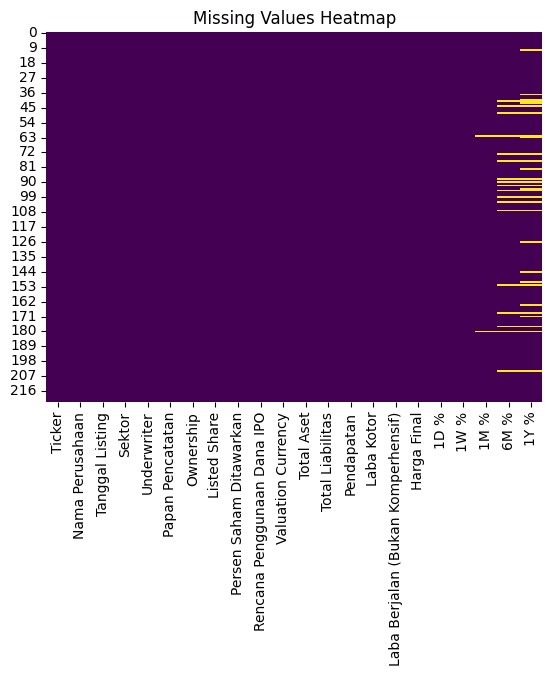

In [55]:
sns.heatmap(df.isna(), cmap='viridis', cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

## Feature Engineering

### Creating a Classification Problem

1. Mengubah kolom 1D % dari numerik menjadi kategorikal berdasarkan ARA.

- Dalam dataset, 999 mengindikasikan saham tersebut ARA pada hari pertama
- Jika 1D % == 999 -> maka kita ubah jadi ARA, sedangkan kalau 1D % > 0 -> maka kita ubah jadi plus, dan kalau 1D % < 0, kita ubah jadi minus.

note ARA {harga}: {ara}
- < 200: +35%
- 200-4999: +25%
- .> 4999: +20%

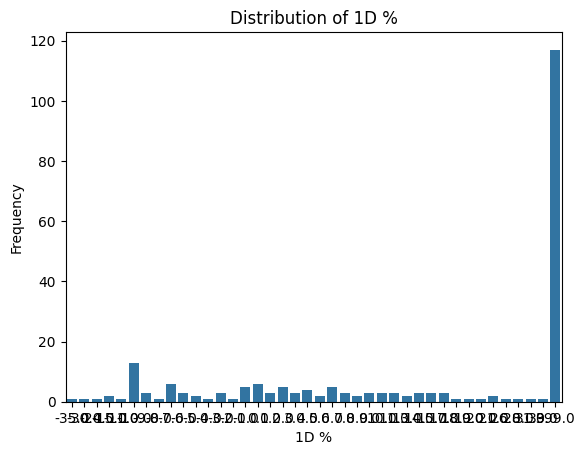

In [56]:
sns.countplot(x="1D %", data=df)
plt.title('Distribution of 1D %')
plt.xlabel('1D %')
plt.ylabel('Frequency')
plt.show()

Sekarang kalau kita ubah:

In [57]:
df['1D %'] = df['1D %'].apply(lambda x: 'ARA' if x == 999 else ('plus' if x >= 0 else 'minus'))

Maka, akan menjadi kolom kategorikal dengan distribusi sebagai berikut:

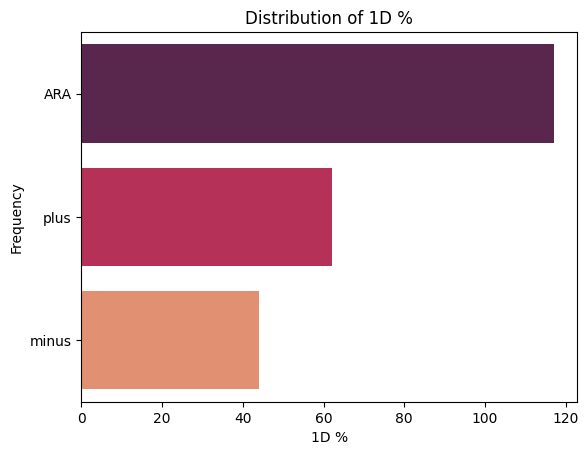

In [58]:
sns.countplot(df['1D %'], palette="rocket")
plt.title('Distribution of 1D %')
plt.xlabel('1D %')
plt.ylabel('Frequency')
plt.show()

Untuk kolom target seperti 1W %, 1M %, 6M %, dan 1Y% masih merupakan kolom numerik. Jadi, kita dapat cek distribusi-nya terlebih dahulu.

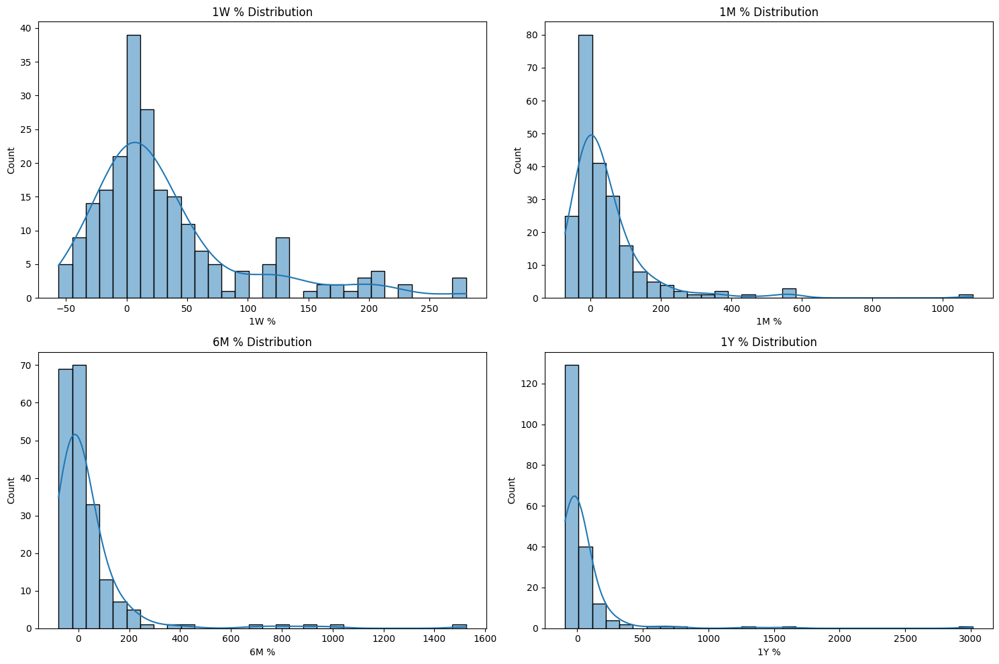

In [59]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.histplot(df['1W %'].dropna(), bins=30, ax=ax[0, 0], kde=True)
sns.histplot(df['1M %'].dropna(), bins=30, ax=ax[0, 1], kde=True)
sns.histplot(df['6M %'].dropna(), bins=30, ax=ax[1, 0], kde=True)
sns.histplot(df['1Y %'].dropna(), bins=30, ax=ax[1, 1], kde=True)
ax[0, 0].set_title('1W % Distribution')
ax[0, 1].set_title('1M % Distribution')
ax[1, 0].set_title('6M % Distribution')
ax[1, 1].set_title('1Y % Distribution')
plt.tight_layout()
plt.show()

Ubah kolom 1W % dan kolom 1M % menjadi 2 kategori yaitu good dan bad

In [60]:
def categorize_mid(val):
    if pd.isnull(val):
        return val
    return 'good' if val >= 5 else 'bad'

for col in ['1W %', '1M %']:
    df[col] = df[col].apply(categorize_mid)

Ubah kolom 6M % dan kolom 1Y % menjadi 2 kategori yaitu plus dan minus

In [61]:
def categorize_long(val):
    if pd.isnull(val):
        return val
    elif val >= 0:
        return 'plus'
    else:
        return 'minus'

for col in ['6M %', '1Y %']:
    df[col] = df[col].apply(categorize_long)

#### Conclusions

Jadi, kita punya sekarang punya target label berupa kategorikal columns.

In [62]:
custom_orders = {
    '1D %': ['ARA', 'plus', 'minus'],
    '1W %': ['good', 'bad'],
    '1M %': ['good', 'bad'],
    '6M %': ['plus', 'minus'],
    '1Y %': ['plus', 'minus']
}

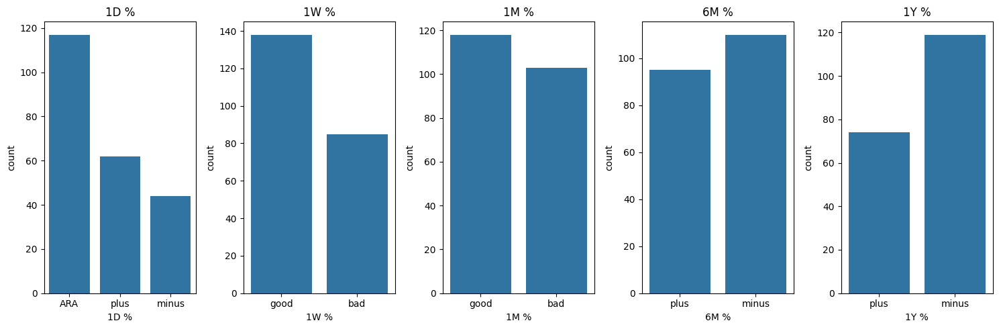

In [63]:
fig, ax = plt.subplots(1, 5, figsize=(15, 5))

cols = ['1D %', '1W %', '1M %', '6M %', '1Y %']

for i, col in enumerate(cols):
    sns.countplot(
        x=col,
        data=df,
        ax=ax[i],
        order=custom_orders.get(col)
    )
    ax[i].set_title(col)

plt.tight_layout()
plt.show()

### 1. Datetime

In [64]:
df['Tanggal Listing'] = pd.to_datetime(df['Tanggal Listing'], format='%d-%b-%y', errors='coerce')
df.sort_values('Tanggal Listing', inplace=True)
df.reset_index(drop=True, inplace=True)
df.head()

,Ticker,Nama Perusahaan,Tanggal Listing,Sektor,Underwriter,Papan Pencatatan,Ownership,Listed Share,Persen Saham Ditawarkan,Rencana Penggunaan Dana IPO,...,Total Liabilitas,Pendapatan,Laba Kotor,Laba Berjalan (Bukan Komperhensif),Harga Final,1D %,1W %,1M %,6M %,1Y %
0,UNIQ,PT Ulima Nitra Tbk,2021-03-08,Energy,PT Surya Fajar Sekuritas,utama,lainnya,3.138983e+09,0.0956,modal kerja,...,2.670000e+11,2.710000e+11,2.454700e+10,-5.617000e+09,118.0,ARA,good,good,minus,minus
1,ARCI,PT Archi Indonesia Tbk,2021-06-28,Basic Materials,PT BNI Sekuritas; PT Mandiri Sekuritas; PT Cit...,pengembangan,konglomerat,2.483500e+10,0.1500,bayar hutang,...,6.860000e+12,4.960000e+12,2.710000e+12,1.490000e+12,750.0,plus,bad,bad,minus,minus
2,MASB,PT Bank Multiarta Sentosa Tbk,2021-06-30,Financials,PT BCA Sekuritas,pemantauan khusus,lainnya,1.226903e+09,0.1500,modal kerja,...,1.960000e+13,1.210000e+12,4.310000e+11,1.080000e+11,3360.0,ARA,bad,bad,plus,plus
3,BMHS,PT Bundamedik Tbk,2021-07-06,Healthcare,PT Ciptadana Sekuritas Asia,utama,konglomerat,8.603416e+09,0.0726,bayar hutang,...,1.110000e+12,1.150000e+12,3.680000e+11,1.180000e+11,340.0,ARA,good,good,plus,plus
4,UVCR,PT Trimegah Karya Pratama Tbk,2021-07-27,Technology,PT Surya Fajar Sekuritas; PT Mirae Asset Sekur...,pengembangan,lainnya,2.000000e+09,0.2500,modal belanja,...,1.435880e+10,1.940000e+11,4.634337e+09,5.434916e+08,100.0,ARA,good,good,plus,plus


### 2. Underwriter

Ini part/fitur paling penting yang jadi patokan orang-orang dalam menentukan apakah dia akan beli saham atau engga.

Insight yang didapat:
- Underwriter mampu membawa harga saham naik.
- Underwriter yang secara historikal dia ampir selalu ngebawa harga sahamnya naik (contohnya ciptadana, trimegah, henan) -> **Ini yang wajib kita catat**
- Underwriter berupa bank gede (biasanya saham yang di bawa dia cenderung sideways (ga naik, ga turun)) (contohnya bca, bri, bni)
- Semakin sering underwriter menjadi bagian yang mempengaruhi saham, semakin tinggi orang-orang pada mau beli tu saham.


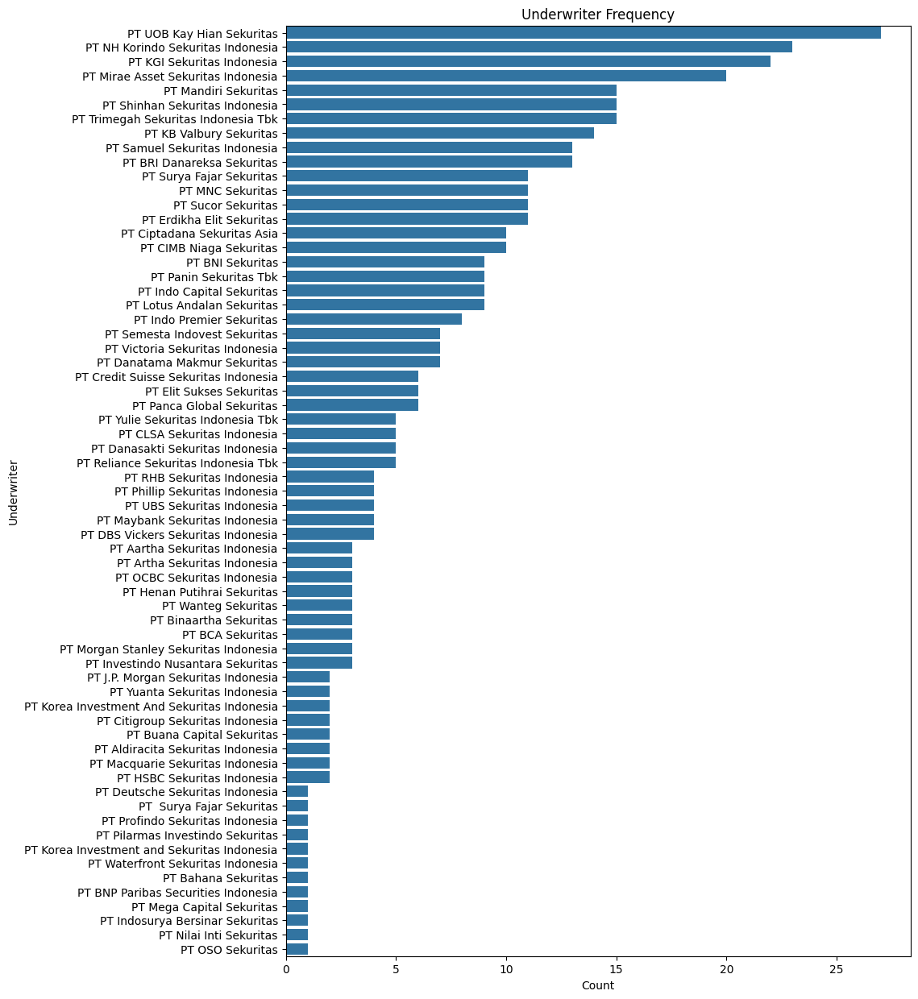

In [65]:
underwriters_exploded = df['Underwriter'].str.split(';').explode().str.strip()
plt.figure(figsize=(10, 15))
sns.countplot(y=underwriters_exploded, order=underwriters_exploded.value_counts().index)
plt.ylabel('Underwriter')
plt.xlabel('Count')
plt.title('Underwriter Frequency')
plt.show()

Sekarang, kita bisa melihat:
1. Underwriter mana yang:
    - paling aktif `freq`
    - cenderung menangani perusahaan besar `avg_aset`
    - mengelola penawaran saham bernilai tinggi `avg_jumlah`
2. Spesialisasi underwriter (apakah ada underwriter yang spesialis di sektor perusahaan dengan aset besar atau kecil?)

Ini juga bakal jadi pertimbangan buat perusahaan buat milih underwriter yang tepat buat perusahaan dia.

In [66]:
freq_dict = {}
aset_dict = {}
jumlah_dict = {}

for idx, row in df.iterrows():
    underwriters = [uw.strip() for uw in row['Underwriter'].split(';') if uw.strip()]
    persen = row['Persen Saham Ditawarkan']
    listed_share = row['Listed Share']
    harga_final = row['Harga Final']
    total_aset = row['Total Aset']

    jumlah = listed_share * harga_final * persen
    for uw in underwriters:
        freq_dict[uw] = freq_dict.get(uw, 0) + 1
        aset_dict[uw] = aset_dict.get(uw, 0.0) + total_aset
        jumlah_dict[uw] = jumlah_dict.get(uw, 0.0) + jumlah

uw_stats = []
for uw in freq_dict:
    freq = freq_dict[uw]
    avg_aset = aset_dict[uw] / freq if freq else 0
    avg_jumlah = jumlah_dict[uw] / freq if freq else 0
    uw_stats.append((uw, freq, avg_aset, avg_jumlah))

uw_df = pd.DataFrame(uw_stats, columns=['underwriter', 'freq', 'avg_aset', 'avg_jumlah']).reset_index(drop=True)
uw_df.head()

,underwriter,freq,avg_aset,avg_jumlah
0,PT Surya Fajar Sekuritas,11,1.894937e+11,1.059479e+11
1,PT BNI Sekuritas,9,3.898356e+13,4.461379e+12
2,PT Mandiri Sekuritas,15,2.824633e+13,6.182559e+12
3,PT Citigroup Sekuritas Indonesia,2,2.134000e+13,6.393589e+12
4,PT Credit Suisse Sekuritas Indonesia,6,4.180333e+13,8.209206e+12


In [67]:
high_aset = uw_df['avg_aset'].quantile(0.75)
low_aset = uw_df['avg_aset'].quantile(0.25)

def aset_category(val):
    if val >= high_aset:
        return 'high'
    elif val <= low_aset:
        return 'low'
    else:
        return 'mid'

uw_df['avg_aset_category'] = uw_df['avg_aset'].apply(aset_category)

high_freq = uw_df['freq'].quantile(0.75)
low_freq = uw_df['freq'].quantile(0.25)

def freq_category(val):
    if val >= high_freq:
        return 'high'
    elif val <= low_freq:
        return 'low'
    else:
        return 'mid'

uw_df['freq_category'] = uw_df['freq'].apply(freq_category)
uw_df.head()

,underwriter,freq,avg_aset,avg_jumlah,avg_aset_category,freq_category
0,PT Surya Fajar Sekuritas,11,1.894937e+11,1.059479e+11,low,high
1,PT BNI Sekuritas,9,3.898356e+13,4.461379e+12,high,high
2,PT Mandiri Sekuritas,15,2.824633e+13,6.182559e+12,high,high
3,PT Citigroup Sekuritas Indonesia,2,2.134000e+13,6.393589e+12,high,low
4,PT Credit Suisse Sekuritas Indonesia,6,4.180333e+13,8.209206e+12,high,mid


Sekarang, kita akan mengelompokkan para underwriter berdasarkan dua metrik yang sudah dihitung sebelumnya:
- rata-rata aset
- frekuensi

Pengelompokkan akan dilakukan menggunakan metode kuantil untuk membagi underwriter ke 3 grup yaitu `high`, `mid`, dan `low`

In [68]:
high_aset = uw_df['avg_aset'].quantile(0.75)
low_aset = uw_df['avg_aset'].quantile(0.25)

In [69]:
def aset_category(val):
    if val >= high_aset:
        return 'high'
    elif val <= low_aset:
        return 'low'
    else:
        return 'mid'

uw_df['avg_aset_category'] = uw_df['avg_aset'].apply(aset_category)

In [70]:
high_freq = uw_df['freq'].quantile(0.75)
low_freq = uw_df['freq'].quantile(0.25)

In [71]:
def freq_category(val):
    if val >= high_freq:
        return 'high'
    elif val <= low_freq:
        return 'low'
    else:
        return 'mid'

uw_df['freq_category'] = uw_df['freq'].apply(freq_category)

Final check:

In [72]:
uw_df.head()

,underwriter,freq,avg_aset,avg_jumlah,avg_aset_category,freq_category
0,PT Surya Fajar Sekuritas,11,1.894937e+11,1.059479e+11,low,high
1,PT BNI Sekuritas,9,3.898356e+13,4.461379e+12,high,high
2,PT Mandiri Sekuritas,15,2.824633e+13,6.182559e+12,high,high
3,PT Citigroup Sekuritas Indonesia,2,2.134000e+13,6.393589e+12,high,low
4,PT Credit Suisse Sekuritas Indonesia,6,4.180333e+13,8.209206e+12,high,mid


Oke, sekarang kita tinggal implementasiin aja ke dataset asli kita.

1. Buat dictionary berdasarkan `freq` dan `avg` tadi buat di mapping.

In [73]:
uw_map_freq_cat = uw_df.set_index('underwriter')['freq_category'].to_dict()
uw_map_aset_cat = uw_df.set_index('underwriter')['avg_aset_category'].to_dict()

2. Buat kategorikal kolom baru (2 buah) dengan mapping dictionary yang tadi.

- Disini, yang diambil adalah max value dari setiap underwriter suatu IPO

In [74]:
cat_order = {'low': 0, 'mid': 1, 'high': 2}
uw_map_freq_cat = uw_df.set_index('underwriter')['freq_category'].to_dict()
uw_map_aset_cat = uw_df.set_index('underwriter')['avg_aset_category'].to_dict()

def max_category(uw_str, uw_map):
    uws = [u.strip() for u in uw_str.split(';') if u.strip()]
    cats = [uw_map.get(u) for u in uws if uw_map.get(u) is not None]
    if not cats:
        return np.nan
    return max(cats, key=lambda x: cat_order[x])

df['underwriter_freq_category'] = df['Underwriter'].apply(lambda x: max_category(x, uw_map_freq_cat))
df['underwriter_avg_aset_category'] = df['Underwriter'].apply(lambda x: max_category(x, uw_map_aset_cat))

Sekarang, kita akan cek performa saham dengan kategori underwriter yang udah kita buat.

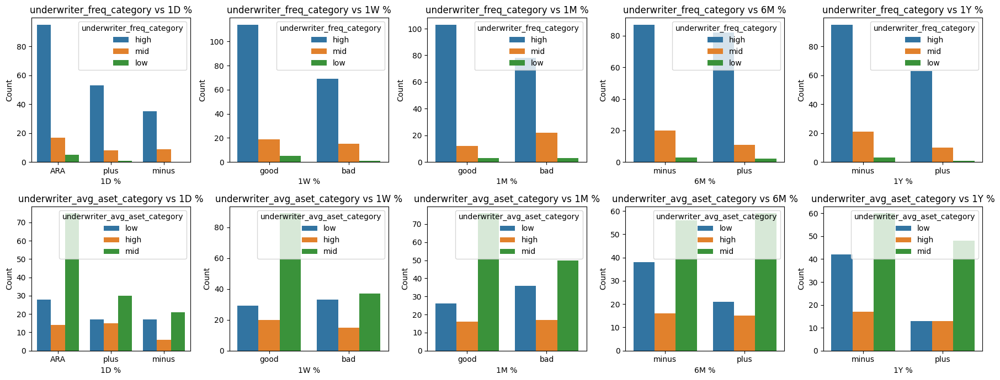

In [75]:
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
target_cols = ['1D %', '1W %', '1M %', '6M %', '1Y %']
plot_cols = ['underwriter_freq_category', 'underwriter_avg_aset_category']

for i, col in enumerate(plot_cols):
    for j, target in enumerate(target_cols):
        ax = axes[i, j]
        sns.countplot(x=df[target], hue=df[col], ax=ax, order = custom_orders.get(col))
        ax.set_title(f"{col} vs {target}")
        ax.set_xlabel(target)
        ax.set_ylabel('Count')
        ax.legend(title=col, loc='best')

plt.tight_layout()
plt.show()

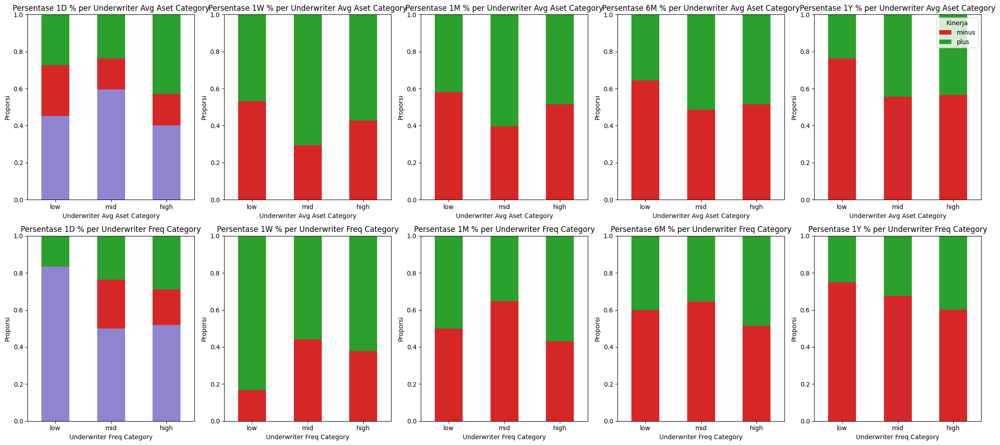

In [76]:
periods = ['1D %', '1W %', '1M %', '6M %', '1Y %']
custom_colors = {
    'minus': '#d62728',
    'plus': '#2ca02c',
    'ARA': "#17009c7b",
    'bad': '#d62728',
    'good': '#2ca02c',
}
cat_order_list = ['low', 'mid', 'high']

fig, axes = plt.subplots(2, len(periods), figsize=(22, 10))

for row_idx, cat_col in enumerate(['underwriter_avg_aset_category', 'underwriter_freq_category']):
    for i, period in enumerate(periods):
        ct_prop = (
            df.groupby(cat_col)[period]
            .value_counts(normalize=True)
            .unstack()
            .fillna(0)
        )
        ct_prop = ct_prop.reindex(cat_order_list)
        labels = ct_prop.columns.tolist()
        color_list = [custom_colors.get(label, '#333333') for label in labels]
        ct_prop[labels].plot(
            kind='bar',
            stacked=True,
            color=color_list,
            ax=axes[row_idx, i],
            legend=False
        )
        axes[row_idx, i].set_title(f'Persentase {period} per {cat_col.replace("_", " ").title()}')
        axes[row_idx, i].set_xlabel(cat_col.replace("_", " ").title())
        axes[row_idx, i].set_ylabel('Proporsi')
        axes[row_idx, i].set_ylim(0, 1)
        axes[row_idx, i].set_xticklabels(cat_order_list, rotation=0)

axes[0, -1].legend(labels, title='Kinerja', loc='upper right')
plt.tight_layout()
plt.show()

**Apakah ada hubungan antara tipe underwriter (berdasarkan frekuensi atau aset klien) dengan kinerja harga saham IPO dalam jangka pendek hingga panjang?**

Insight:
1. 1D % tidak terlalu terlihat polanya jika dari frekuensi underwriter membawakan IPO dan rata-rata besarnya perusahaan yang biasa dibawahakannya.
2. Underwriter yang biasanya membawakan perusahaan-perusahaan yang lebih besar cenderung memberikan kinerja yang lebih baik. Namun, ini dapat juga dikarenakan
   perusahaan yang lebih besar cenderung lebih baik kinerja IPO nya.
2. Frekuensi underwriter tidak terlalu terlihat polanya terhadap kinerja saham IPO yang dibawakannya.

Kemudian, underwriter dikategorikan menjadi 3 tingakat, alpha beta gamma. bikin kategorinya 3 biji, buat short term (1D), mid term (1M), long term (1Y)

In [77]:
label_cols = [
    '1D_ARA', '1D_plus', '1D_minus',
    #'1W_good', '1W_bad',
    '1M_good', '1M_bad',
    #'6M_plus', '6M_minus',
    '1Y_plus', '1Y_minus'
]

for col in label_cols:
    uw_df[col] = 0

uw_df.head()

,underwriter,freq,avg_aset,avg_jumlah,avg_aset_category,freq_category,1D_ARA,1D_plus,1D_minus,1M_good,1M_bad,1Y_plus,1Y_minus
0,PT Surya Fajar Sekuritas,11,1.894937e+11,1.059479e+11,low,high,0,0,0,0,0,0,0
1,PT BNI Sekuritas,9,3.898356e+13,4.461379e+12,high,high,0,0,0,0,0,0,0
2,PT Mandiri Sekuritas,15,2.824633e+13,6.182559e+12,high,high,0,0,0,0,0,0,0
3,PT Citigroup Sekuritas Indonesia,2,2.134000e+13,6.393589e+12,high,low,0,0,0,0,0,0,0
4,PT Credit Suisse Sekuritas Indonesia,6,4.180333e+13,8.209206e+12,high,mid,0,0,0,0,0,0,0


Reset dulu sebentar

In [78]:
def reset_label_cols(uw_df, label_cols):
    uw_df[label_cols] = 0
    return uw_df

In [79]:
def update_uw_df_counts(df, uw_df):
    for idx, row in df.iterrows():
        val_1d = row['1D %']
        val_1m = row['1M %']
        val_1y = row['1Y %']
        underwriters = [uw.strip() for uw in row['Underwriter'].split(';') if uw.strip()]
        for uw in underwriters:
            uw_idx = uw_df[uw_df['underwriter'] == uw].index
            if not uw_idx.empty:
                uw_idx = uw_idx[0]

                if val_1d in ['ARA', 'plus', 'minus']:
                    col_1d = f"1D_{val_1d}"
                    if col_1d in uw_df.columns:
                        uw_df.at[uw_idx, col_1d] += 1

                if val_1m in ['good', 'bad']:
                    col_1m = f"1M_{val_1m}"
                    if col_1m in uw_df.columns:
                        uw_df.at[uw_idx, col_1m] += 1

                if val_1y in ['plus', 'minus']:
                    col_1y = f"1Y_{val_1y}"
                    if col_1y in uw_df.columns:
                        uw_df.at[uw_idx, col_1y] += 1
    return uw_df

In [80]:
uw_df['short_rep'] = 'gamma'
df_copy = df.copy()

while True:
    uw_df = reset_label_cols(uw_df, label_cols)
    uw_df = update_uw_df_counts(df_copy, uw_df)
    uw_df['score'] = uw_df['1D_ARA'] * 1 + uw_df['1D_minus'] * -1 + uw_df['1D_plus'] * 0.25

    top_uw_idx = uw_df['score'].idxmax()
    top_uw = uw_df.at[top_uw_idx, 'underwriter']
    top_score = uw_df.at[top_uw_idx, 'score']

    denominator = (
        float(uw_df.at[top_uw_idx, '1D_ARA'])
        + float(uw_df.at[top_uw_idx, '1D_plus'])
        + float(uw_df.at[top_uw_idx, '1D_minus'])
    )
    if denominator == 0:
        percentage_score = 0
    else:
        percentage_score = (
            float(uw_df.at[top_uw_idx, '1D_ARA'])
            + 0.25 * float(uw_df.at[top_uw_idx, '1D_plus'])
        ) / denominator

    if percentage_score < 0.4:
        break
    if percentage_score > 0.66 and (uw_df.at[top_uw_idx, '1D_ARA'] >= (uw_df.at[top_uw_idx, '1D_minus'] + uw_df.at[top_uw_idx, '1D_plus'])):
        uw_df.at[top_uw_idx, 'short_rep'] = 'alpha'
    else:
        uw_df.at[top_uw_idx, 'short_rep'] = 'beta'

    df_copy = df_copy[~df_copy['Underwriter'].str.contains(rf'\b{top_uw}\b', regex=True)]

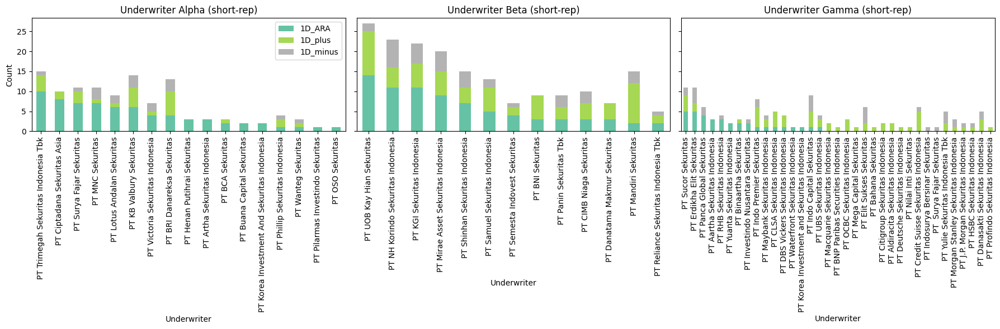

In [81]:
uw_df = reset_label_cols(uw_df, label_cols)
uw_df = update_uw_df_counts(df, uw_df)

groups = ['alpha', 'beta', 'gamma']
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, group in enumerate(groups):
    subset = uw_df[uw_df['short_rep'] == group][['underwriter', '1D_ARA', '1D_plus', '1D_minus']]
    subset = subset.sort_values('1D_ARA', ascending=False)
    subset.set_index('underwriter', inplace=True)
    subset[['1D_ARA', '1D_plus', '1D_minus']].plot(
        kind='bar', stacked=True, ax=axes[i], legend=(i==0), colormap='Set2'
    )
    axes[i].set_title(f'Underwriter {group.capitalize()} (short-rep)')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Underwriter')
    axes[i].tick_params(axis='x', labelrotation=90)

plt.tight_layout()
plt.show()

In [82]:
uw_df['mid_rep'] = 'gamma'
df_copy = df.copy()

while True:
    uw_df = reset_label_cols(uw_df, label_cols)
    uw_df = update_uw_df_counts(df_copy, uw_df)
    uw_df['score'] = uw_df['1M_good'] * 1 + uw_df['1M_bad'] * -1

    top_uw_idx = uw_df['score'].idxmax()
    top_uw = uw_df.at[top_uw_idx, 'underwriter']
    top_score = uw_df.at[top_uw_idx, 'score']

    denominator = (
        float(uw_df.at[top_uw_idx, '1M_good'])
        + float(uw_df.at[top_uw_idx, '1M_bad'])
    )
    if denominator == 0:
        percentage_score = 0
    else:
        percentage_score = float(uw_df.at[top_uw_idx, '1M_good']) / denominator

    if percentage_score < 0.5:
        break
    if percentage_score > 0.66:
        uw_df.at[top_uw_idx, 'mid_rep'] = 'alpha'
    else:
        uw_df.at[top_uw_idx, 'mid_rep'] = 'beta'

    df_copy = df_copy[~df_copy['Underwriter'].str.contains(rf'\b{top_uw}\b', regex=True)]

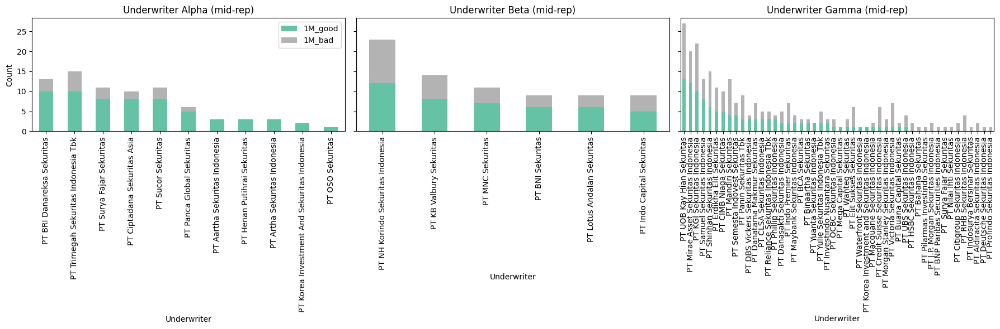

In [83]:
uw_df = reset_label_cols(uw_df, label_cols)
uw_df = update_uw_df_counts(df, uw_df)

groups = ['alpha', 'beta', 'gamma']
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, group in enumerate(groups):
    subset = uw_df[uw_df['mid_rep'] == group][['underwriter', '1M_good', '1M_bad']]
    subset = subset.sort_values('1M_good', ascending=False)
    subset.set_index('underwriter', inplace=True)
    subset[['1M_good', '1M_bad']].plot(
        kind='bar', stacked=True, ax=axes[i], legend=(i==0), colormap='Set2'
    )
    axes[i].set_title(f'Underwriter {group.capitalize()} (mid-rep)')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Underwriter')
    axes[i].tick_params(axis='x', labelrotation=90)

plt.tight_layout()
plt.show()


In [84]:
uw_df['long_rep'] = 'gamma'
df_copy = df.copy()

while True:
    uw_df = reset_label_cols(uw_df, label_cols)
    uw_df = update_uw_df_counts(df_copy, uw_df)
    uw_df['score'] = uw_df['1Y_plus'] * 2 + uw_df['1Y_minus'] * -1

    top_uw_idx = uw_df['score'].idxmax()
    top_uw = uw_df.at[top_uw_idx, 'underwriter']
    top_score = uw_df.at[top_uw_idx, 'score']

    denominator = (
        float(uw_df.at[top_uw_idx, '1Y_plus'])
        + float(uw_df.at[top_uw_idx, '1Y_minus'])
    )
    if denominator == 0:
        percentage_score = 0
    else:
        percentage_score = float(uw_df.at[top_uw_idx, '1Y_plus']) / denominator

    if percentage_score < 0.4:
        break
    if percentage_score > 0.55:
        uw_df.at[top_uw_idx, 'long_rep'] = 'alpha'
    else:
        uw_df.at[top_uw_idx, 'long_rep'] = 'beta'

    df_copy = df_copy[~df_copy['Underwriter'].str.contains(rf'\b{top_uw}\b', regex=True)]

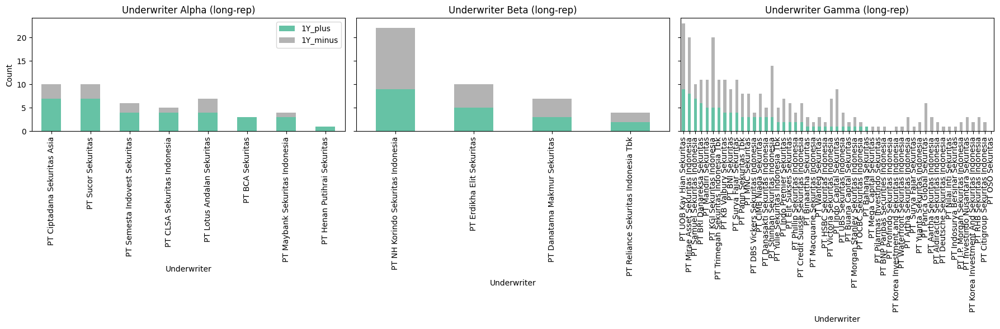

In [85]:
uw_df = reset_label_cols(uw_df, label_cols)
uw_df = update_uw_df_counts(df, uw_df)

groups = ['alpha', 'beta', 'gamma']
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, group in enumerate(groups):
    subset = uw_df[uw_df['long_rep'] == group][['underwriter', '1Y_plus', '1Y_minus']]
    subset = subset.sort_values('1Y_plus', ascending=False)
    subset.set_index('underwriter', inplace=True)
    subset[['1Y_plus', '1Y_minus']].plot(
        kind='bar', stacked=True, ax=axes[i], legend=(i==0), colormap='Set2'
    )
    axes[i].set_title(f'Underwriter {group.capitalize()} (long-rep)')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Underwriter')
    axes[i].tick_params(axis='x', labelrotation=90)

plt.tight_layout()
plt.show()

In [86]:
uw_df = reset_label_cols(uw_df, label_cols)
uw_df = update_uw_df_counts(df, uw_df)
uw_df = uw_df.drop(columns=['score'], errors='ignore')

Dibuat lagi 1 kolom `underwriter_has_bigbank` yang menandakan apakah pada IPO saham itu terdapat bigbank yang terlibat sebagai underwriternya

In [87]:
big_banks_sekuritas = [
    'PT BNI Sekuritas',
    'PT Mandiri Sekuritas',
    'PT Citigroup Sekuritas Indonesia',
    'PT Credit Suisse Sekuritas Indonesia',
    'PT UOB Kay Hian Sekuritas',
    'PT BCA Sekuritas',
    'PT Mirae Asset Sekuritas Indonesia',
    'PT BRI Danareksa Sekuritas',
    'PT UBS Sekuritas Indonesia',
    'PT HSBC Sekuritas Indonesia',
    'PT J.P. Morgan Sekuritas Indonesia',
    'PT Morgan Stanley Sekuritas Indonesia',
    'PT CIMB Niaga Sekuritas',
    'PT CLSA Sekuritas Indonesia',
    'PT Maybank Sekuritas Indonesia',
    'PT DBS Vickers Sekuritas Indonesia',
    'PT Deutsche Sekuritas Indonesia',
    'PT Mega Capital Sekuritas',
    'PT Macquarie Sekuritas Indonesia',
    'PT BNP Paribas Securities Indonesia',
    'PT OCBC Sekuritas Indonesia'
]

In [88]:
uw_df['bigbank'] = 'no'

for idx, row in uw_df.iterrows():
    uw = row['underwriter']

    if uw in big_banks_sekuritas:
        uw_df.at[idx, 'bigbank'] = 'yes'

uw_df['bigbank'] = uw_df['bigbank'].astype('object')

In [89]:
df['underwriter_has_bigbank'] = 'no'

for idx, row in df.iterrows():
    underwriters = [uw.strip() for uw in row['Underwriter'].split(';') if uw.strip()]

    if any(uw in big_banks_sekuritas for uw in underwriters):
        df.at[idx, 'underwriter_has_bigbank'] = 'yes'

df['underwriter_has_bigbank'] = df['underwriter_has_bigbank'].astype('object')

Untuk pada dataset IPO, 'underwriter_highest_tier' melambangkan rank tertinggi underwriter yang ada pada IPO tersebut, sedangkan 'underwriter_has_bigbank' menandakan ada big bank atau tidak pada underwriternya.

In [90]:
tier_rank = {'alpha': 1, 'beta': 2, 'gamma': 3}
rank_to_tier = {v: k for k, v in tier_rank.items()}

def process_row(row, uw_df, big_banks_sekuritas):
    underwriter_str = row.get('Underwriter', '')
    underwriters = [uw.strip() for uw in str(underwriter_str).split(';') if uw.strip()]

    uw_subset = uw_df[uw_df['underwriter'].isin(underwriters)]

    result = {}

    for rep_type in ['short', 'mid', 'long']:
        col = f'{rep_type}_rep'
        if not uw_subset.empty:
            tier_values = uw_subset[col].map(tier_rank).dropna()
            best_rank = tier_values.min()
            result[f'underwriter_highest_{rep_type}_rep'] = rank_to_tier[best_rank]
        else:
            result[f'underwriter_highest_{rep_type}_rep'] = None

    return pd.Series(result)

new_cols = df.apply(lambda row: process_row(row, uw_df, big_banks_sekuritas), axis=1)
df = df.join(new_cols)

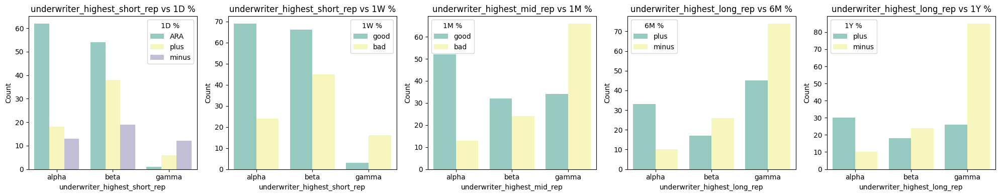

In [91]:
time_to_tier = {
    '1D %': 'underwriter_highest_short_rep',
    '1W %': 'underwriter_highest_short_rep',
    '1M %': 'underwriter_highest_mid_rep',
    '6M %': 'underwriter_highest_long_rep',
    '1Y %': 'underwriter_highest_long_rep',
}

custom_orders = {
    '1D %': ['ARA', 'plus', 'minus'],
    '1W %': ['good', 'bad'],
    '1M %': ['good', 'bad'],
    '6M %': ['plus', 'minus'],
    '1Y %': ['plus', 'minus']
}

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, col in enumerate(['1D %', '1W %', '1M %', '6M %', '1Y %']):
    x_col = time_to_tier[col]
    sns.countplot(x=df[x_col], hue=df[col], hue_order=custom_orders.get(col), ax=axes[i],
                    order=['alpha', 'beta', 'gamma'],
                    palette='Set3'
                    )
    axes[i].set_title(f'{x_col} vs {col}')
    axes[i].set_xlabel(x_col)
    axes[i].set_ylabel('Count')
    axes[i].legend(title=col, loc='best')
plt.tight_layout()
plt.show()

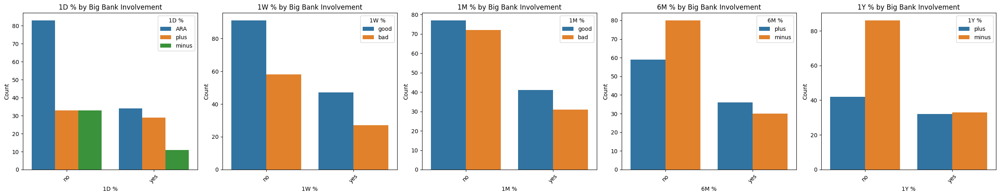

In [92]:
fig, axes = plt.subplots(1, 5, figsize=(25, 5))
cols = ['1D %', '1W %', '1M %', '6M %', '1Y %']

for i, col in enumerate(cols):
    sns.countplot(data=df, x='underwriter_has_bigbank', hue=col, hue_order=custom_orders.get(col), ax=axes[i])
    axes[i].set_title(f"{col} by Big Bank Involvement")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

- Untuk day 1, big bank terlihat lebih cenderung stabil saham IPO nya, sedangkan yang lainnya lebih volatil
- Terutama pada jangka panjang (6M, 1Y), bank besar terlihat mampu menjaga harganya dengan lebih baik

### 3. Seasonality

kolom yang mencatat kuartal saat saham listing

In [93]:
def month_to_quartal(month):
    if month in [1, 2, 3]:
        return 'I'
    elif month in [4, 5, 6]:
        return 'II'
    elif month in [7, 8, 9]:
        return 'III'
    elif month in [10, 11, 12]:
        return 'IV'
    else:
        return 'Unknown'

df['Listing Quartal'] = df['Tanggal Listing'].dt.month
df['Listing Quartal'] = df['Listing Quartal'].apply(month_to_quartal)
df = df.drop(columns=['Tanggal Listing'])
df['Listing Quartal'].value_counts()

Listing Quartal
I      71
III    66
IV     51
II     35
Name: count, dtype: int64

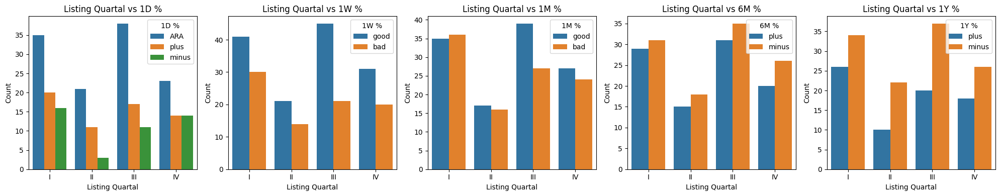

In [94]:
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, col in enumerate(['1D %', '1W %', '1M %', '6M %', '1Y %']):
    sns.countplot(x=df['Listing Quartal'], hue=df[col], hue_order=custom_orders.get(col), ax=axes[i])
    axes[i].set_title(f'Listing Quartal vs {col}')
    axes[i].set_xlabel('Listing Quartal')
    axes[i].set_ylabel('Count')
    axes[i].legend(title=col, loc='best')
plt.tight_layout()
plt.show()

- Dari countplot tersebut, tidak terlihat adanya pengaruh kuaral listing terhadap kinerja saham IPO.

### 4. Financials

In [95]:
df['ipo_raised_fund'] = df['Listed Share'] * df['Harga Final'] * df['Persen Saham Ditawarkan']

df['equity'] = df['Total Aset'] - df['Total Liabilitas']
df['leverage'] = df['Total Liabilitas'] / df['equity']
df['turnover'] = df['Pendapatan'] / df['Total Aset']


df['PER'] = df['Harga Final'] / (df['Laba Berjalan (Bukan Komperhensif)'] / df['Listed Share'])
df['PBV'] = df['Harga Final'] / (df['equity'] / df['Listed Share'])
df['PER'] = df['PER'].clip(upper=100)
df['PBV'] = df['PBV'].clip(upper=10)

df['ROA'] = df['Laba Berjalan (Bukan Komperhensif)'] / df['Total Aset']
df['ROE'] = df['Laba Berjalan (Bukan Komperhensif)'] / df['equity']
df['NPM'] = df['Laba Berjalan (Bukan Komperhensif)'] / df['Pendapatan']

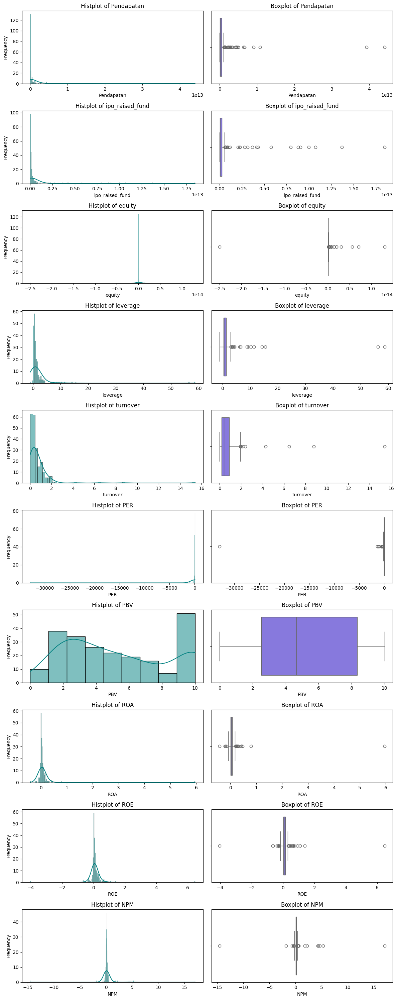

In [96]:
financial_cols = [
    'Pendapatan', 'ipo_raised_fund', 'equity', 'leverage', 'turnover',
    'PER', 'PBV', 'ROA', 'ROE', 'NPM'
]

fig, axes = plt.subplots(len(financial_cols), 2, figsize=(12, 3 * len(financial_cols)))

for idx, col in enumerate(financial_cols):
    data = df[col]

    sns.histplot(data, ax=axes[idx, 0], kde=True, color='teal')
    axes[idx, 0].set_title(f'Histplot of {col}')
    axes[idx, 0].set_xlabel(col)
    axes[idx, 0].set_ylabel('Frequency')
    
    sns.boxplot(x=data, ax=axes[idx, 1], orient='h', color='mediumslateblue')
    axes[idx, 1].set_title(f'Boxplot of {col}')
    axes[idx, 1].set_xlabel(col)

plt.tight_layout()
plt.show()

Signed log transform diterapkan karena data terlalu skewed

In [97]:
def signed_log1p(x):
    return np.sign(x) * np.log1p(np.abs(x))

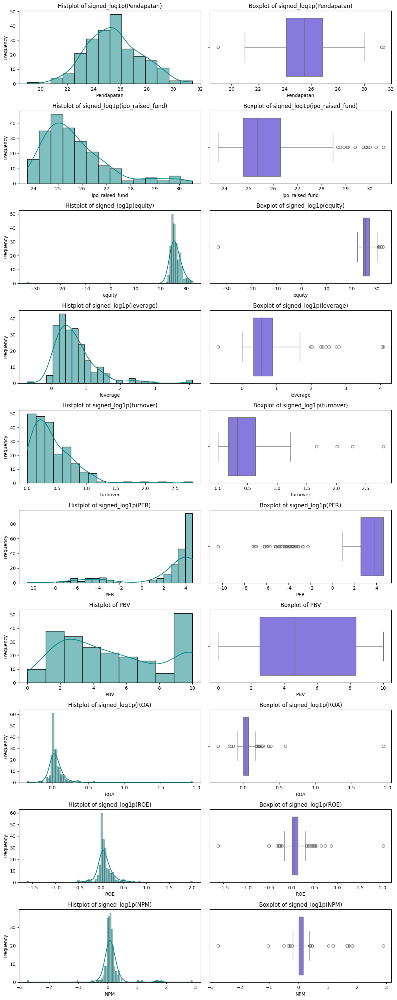

In [98]:
fig, axes = plt.subplots(len(financial_cols), 2, figsize=(12, 3 * len(financial_cols)))

for idx, col in enumerate(financial_cols):
    data = df[col]

    if col != 'PBV':  
        data = signed_log1p(data)

    sns.histplot(data, ax=axes[idx, 0], kde=True, color='teal')
    axes[idx, 0].set_title(f'Histplot of {"signed_log1p(" + col + ")" if col != "PBV" else col}')
    axes[idx, 0].set_xlabel(col)
    axes[idx, 0].set_ylabel('Frequency')

    sns.boxplot(x=data, ax=axes[idx, 1], orient='h', color='mediumslateblue')
    axes[idx, 1].set_title(f'Boxplot of {"signed_log1p(" + col + ")" if col != "PBV" else col}')
    axes[idx, 1].set_xlabel(col)

    df[col] = data

plt.tight_layout()
plt.show()

### 5. Rencana Penggunaan Dana

In [99]:
df['Rencana Penggunaan Dana IPO'].value_counts()

Rencana Penggunaan Dana IPO
modal kerja      100
modal belanja     71
ekspansi          26
bayar hutang      23
belanja modal      3
Name: count, dtype: int64

In [100]:
df['Rencana Penggunaan Dana IPO'] = np.where(
    df['Rencana Penggunaan Dana IPO'] == 'bayar hutang',
    'bayar hutang',
    'modal perusahaan'
)

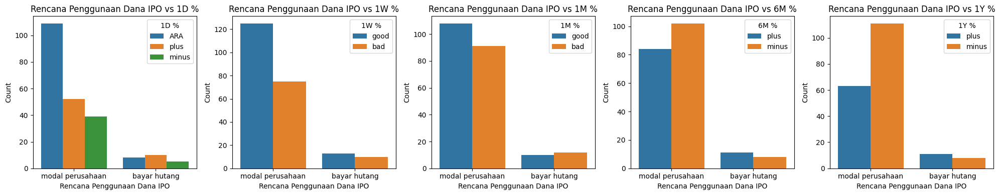

In [101]:
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, col in enumerate(cols):
    sns.countplot(x='Rencana Penggunaan Dana IPO', hue=col, data=df, hue_order=custom_orders.get(col), ax=axes[i])
    axes[i].set_title(f'Rencana Penggunaan Dana IPO vs {col}')
    axes[i].set_xlabel('Rencana Penggunaan Dana IPO')
    axes[i].set_ylabel('Count')
    axes[i].legend(title=col, loc='best')

plt.tight_layout()
plt.show()

- Karena data sedikit dan terlalu imbalance, maka kolom ini tidak digunakan untuk menghindari overfitting
- Penelitian menunjukan perusahaan IPO dengan tujuan membayar hutang lebih tidak disukai

### 6. Drop yang ga dipake

In [103]:
df = df.drop(['Listed Share', 'Rencana Penggunaan Dana IPO', 'Valuation Currency', 'Total Liabilitas', 'Laba Kotor', 'Laba Berjalan (Bukan Komperhensif)'], axis=1)

### 7. Total Aset (Numeric -> Category)

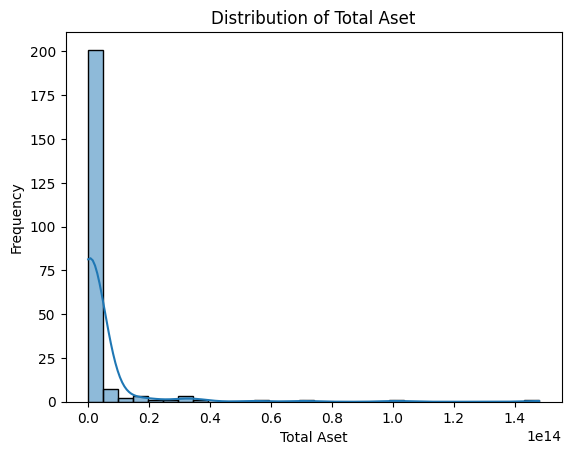

In [104]:
sns.histplot(data=df, x='Total Aset', kde=True, bins=30)
plt.title('Distribution of Total Aset')
plt.xlabel('Total Aset')
plt.ylabel('Frequency')
plt.show()

In [105]:
df['Total Aset'] = np.log1p(df['Total Aset'].clip(lower=1e-9))

In [106]:
df['total_aset_category'] = pd.cut(
    df['Total Aset'],
    bins=[-float('inf'), df['Total Aset'].quantile(0.25), df['Total Aset'].quantile(0.75), float('inf')],
    labels=['low', 'mid', 'high']
)

In [107]:
df['total_aset_category'] = df['total_aset_category'].astype('object')

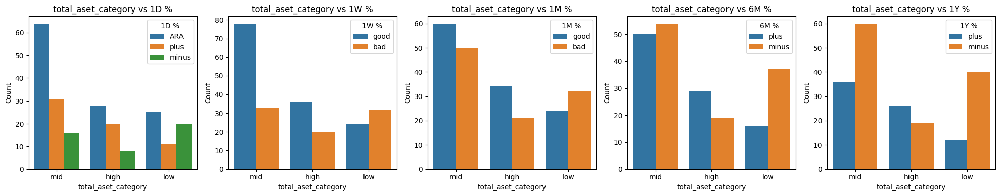

In [108]:
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, col in enumerate(['1D %', '1W %', '1M %', '6M %', '1Y %']):
    sns.countplot(x=df['total_aset_category'], hue=df[col], hue_order=custom_orders.get(col), ax=axes[i])
    axes[i].set_title(f'total_aset_category vs {col}')
    axes[i].set_xlabel('total_aset_category')
    axes[i].set_ylabel('Count')
    axes[i].legend(title=col, loc='best')
plt.tight_layout()
plt.show()

- Perusahaan aset tinggi cenderung perform lebih baik

### 8. Harga Final (Numeric -> Category)

In [109]:
df['price_category'] = pd.cut(
    df['Harga Final'],
    bins=[-float('inf'), 200, 500, 2000, 5000, float('inf')],
    labels=['penny', 'low', 'medium', 'high', 'premium']
)

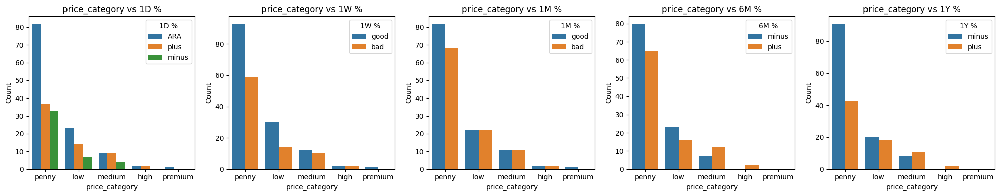

In [110]:
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, col in enumerate(['1D %', '1W %', '1M %', '6M %', '1Y %']):
    sns.countplot(x=df['price_category'], hue=df[col], ax=axes[i])
    axes[i].set_title(f'price_category vs {col}')
    axes[i].set_xlabel('price_category')
    axes[i].set_ylabel('Count')
    axes[i].legend(title=col, loc='best')
plt.tight_layout()
plt.show()

In [111]:
df['price_category'] = df['price_category'].astype('object')

## Encoding

In [112]:
df = df.drop('Ticker', axis = 1)
df = df.drop('Nama Perusahaan', axis = 1)

In [113]:
categorical_cols = df.select_dtypes(include='object').drop(columns=['Underwriter'])
for col in categorical_cols:
    if col != 'Underwriter' and col != 'lead_underwriter':
        print(f"{col}:")
        print(df[col].unique())
        print('-' * 40)

Sektor:
['Energy' 'Basic Materials' 'Financials' 'Healthcare' 'Technology'
 'Transportation & Logistic' 'Consumer Non-Cyclicals' 'Industrials'
 'Consumer Cyclicals' 'Infrastructures' 'Properties & Real Estate']
----------------------------------------
Papan Pencatatan:
['utama' 'pengembangan' 'pemantauan khusus' 'akselerasi' 'ekonomi baru']
----------------------------------------
Ownership:
['lainnya' 'konglomerat' 'start up' 'bumn']
----------------------------------------
1D %:
['ARA' 'plus' 'minus']
----------------------------------------
1W %:
['good' 'bad']
----------------------------------------
1M %:
['good' 'bad' nan]
----------------------------------------
6M %:
['minus' 'plus' nan]
----------------------------------------
1Y %:
['minus' 'plus' nan]
----------------------------------------
underwriter_freq_category:
['high' 'mid' 'low']
----------------------------------------
underwriter_avg_aset_category:
['low' 'high' 'mid']
----------------------------------------
unde

In [114]:
df['price_category'].value_counts()

price_category
penny      152
low         44
medium      22
high         4
premium      1
Name: count, dtype: int64

In [115]:
manual_orders = {
    'Papan Pencatatan': ['utama', 'pengembangan', 'akselerasi', 'ekonomi baru', 'pemantauan khusus'],
    'Ownership': ['bumn', 'konglomerat', 'start up', 'lainnya'],
    'underwriter_freq_category': ['low', 'mid', 'high'],
    'underwriter_avg_aset_category': ['low', 'mid', 'high'],
    'Listing Quartal': ['I', 'II', 'III', 'IV'],
    'total_aset_category': ['low', 'mid', 'high'],
    'price_category': ['penny', 'low', 'medium', 'high', 'premium'],
    'underwriter_highest_short_rep' : ['gamma', 'beta', 'alpha'],
    'underwriter_highest_mid_rep' : ['gamma', 'beta', 'alpha'],
    'underwriter_highest_long_rep' : ['gamma', 'beta', 'alpha'],
    'underwriter_has_bigbank' : ['no', 'yes']
}

label_encoders = {}
encoded_mappings = {}

for col in categorical_cols:
    if col in manual_orders:
        mapping = {v: i for i, v in enumerate(manual_orders[col])}
        df[col] = df[col].map(lambda x: mapping[x] if pd.notna(x) else np.nan)
        encoded_mappings[col] = mapping
        label_encoders[col] = 'manual'
    else:
        le = LabelEncoder()  
        df[col] = df[col].astype("str")
        df[col] = le.fit_transform(df[col])
        label_encoders[col] = le
        encoded_mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))  

    df[col] = pd.to_numeric(df[col], errors='coerce')

In [116]:
for col, mapping in encoded_mappings.items():
    print(f"{col}: {mapping}")

Sektor: {'Basic Materials': 0, 'Consumer Cyclicals': 1, 'Consumer Non-Cyclicals': 2, 'Energy': 3, 'Financials': 4, 'Healthcare': 5, 'Industrials': 6, 'Infrastructures': 7, 'Properties & Real Estate': 8, 'Technology': 9, 'Transportation & Logistic': 10}
Papan Pencatatan: {'utama': 0, 'pengembangan': 1, 'akselerasi': 2, 'ekonomi baru': 3, 'pemantauan khusus': 4}
Ownership: {'bumn': 0, 'konglomerat': 1, 'start up': 2, 'lainnya': 3}
1D %: {'ARA': 0, 'minus': 1, 'plus': 2}
1W %: {'bad': 0, 'good': 1}
1M %: {'bad': 0, 'good': 1, 'nan': 2}
6M %: {'minus': 0, 'nan': 1, 'plus': 2}
1Y %: {'minus': 0, 'nan': 1, 'plus': 2}
underwriter_freq_category: {'low': 0, 'mid': 1, 'high': 2}
underwriter_avg_aset_category: {'low': 0, 'mid': 1, 'high': 2}
underwriter_has_bigbank: {'no': 0, 'yes': 1}
underwriter_highest_short_rep: {'gamma': 0, 'beta': 1, 'alpha': 2}
underwriter_highest_mid_rep: {'gamma': 0, 'beta': 1, 'alpha': 2}
underwriter_highest_long_rep: {'gamma': 0, 'beta': 1, 'alpha': 2}
Listing Quartal:

## Correlation

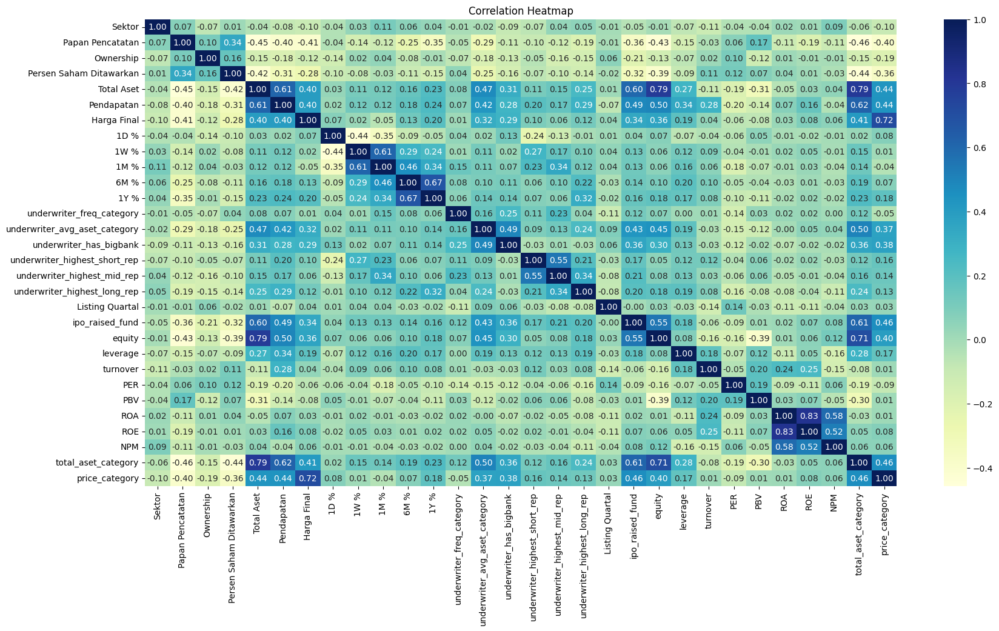

In [117]:
corr_df = df.drop(columns=['Underwriter'])
corr_matrix = corr_df.corr(method='kendall')

plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='YlGnBu', cbar=True)
plt.title('Correlation Heatmap')
plt.show()

## Final Columns

In [120]:
custom_columns = [
    ('Ownership', 'ownership'),
    ('Papan Pencatatan', 'papan_pencatatan'),
    ('ipo_raised_fund', 'ipo_raised_fund'),
    ('Persen Saham Ditawarkan', 'float'),
    ('price_category', 'price_cat'),

    ('underwriter_freq_category', 'underwriter_freq_cat'),
    ('underwriter_avg_aset_category', 'underwriter_avg_aset_cat'),
    ('underwriter_highest_short_rep', 'underwriter_highest_short_rep'),
    ('underwriter_highest_mid_rep', 'underwriter_highest_mid_rep'),
    ('underwriter_highest_long_rep', 'underwriter_highest_long_rep'),
    ('underwriter_has_bigbank', 'underwriter_has_bigbank'),

    ('total_aset_category', 'total_aset_cat'),
    ('equity', 'equity'),
    ('leverage', 'leverage_ratio'),
    ('Pendapatan', 'revenue'),
    ('turnover', 'turnover_ratio'),
    ('PER', 'per'),
    ('PBV', 'pbv'),
    ('ROE', 'roe'),

    ('1D %', '1d'),
    ('1W %', '1w'),
    ('1M %', '1m'),
    ('6M %', '6m'),
    ('1Y %', '1y'),
]

orig_cols, new_names = zip(*custom_columns)

df_custom = df[list(orig_cols)].copy()
df_custom.columns = new_names

df_custom.head()

,ownership,papan_pencatatan,ipo_raised_fund,float,price_cat,underwriter_freq_cat,underwriter_avg_aset_cat,underwriter_highest_short_rep,underwriter_highest_mid_rep,underwriter_highest_long_rep,...,revenue,turnover_ratio,per,pbv,roe,1d,1w,1m,6m,1y
0,3,0,24.290267,0.0956,0,2,0,2,2,0,...,26.325385,0.406699,-4.203837,1.356777,-0.020366,0,1,1,0,0
1,1,1,28.658473,0.1500,2,2,2,1,1,0,...,29.232427,0.435836,2.602752,8.390203,0.513525,2,0,0,0,0
2,3,4,27.150335,0.1500,3,1,1,2,0,2,...,27.821641,0.054752,3.667919,2.169681,0.055285,0,0,0,2,2
3,1,0,26.081580,0.0726,1,2,1,2,2,2,...,27.770783,0.426840,3.249968,2.785868,0.106503,0,1,1,2,2
4,3,1,24.635289,0.2500,0,2,1,2,2,1,...,25.991124,1.666251,4.615121,6.485393,0.017470,0,1,1,2,2


## Installations

In [121]:
# %%capture

# !pip install tabpfn

In [122]:
# %%capture

# !pip install lime

In [123]:
# %%capture

# !pip install pytorch-tabnet

## Feature Selections

In [124]:
df_custom.head()

,ownership,papan_pencatatan,ipo_raised_fund,float,price_cat,underwriter_freq_cat,underwriter_avg_aset_cat,underwriter_highest_short_rep,underwriter_highest_mid_rep,underwriter_highest_long_rep,...,revenue,turnover_ratio,per,pbv,roe,1d,1w,1m,6m,1y
0,3,0,24.290267,0.0956,0,2,0,2,2,0,...,26.325385,0.406699,-4.203837,1.356777,-0.020366,0,1,1,0,0
1,1,1,28.658473,0.1500,2,2,2,1,1,0,...,29.232427,0.435836,2.602752,8.390203,0.513525,2,0,0,0,0
2,3,4,27.150335,0.1500,3,1,1,2,0,2,...,27.821641,0.054752,3.667919,2.169681,0.055285,0,0,0,2,2
3,1,0,26.081580,0.0726,1,2,1,2,2,2,...,27.770783,0.426840,3.249968,2.785868,0.106503,0,1,1,2,2
4,3,1,24.635289,0.2500,0,2,1,2,2,1,...,25.991124,1.666251,4.615121,6.485393,0.017470,0,1,1,2,2


In [125]:
from typing import List, Dict

def select_features_by_kendall(
    df: pd.DataFrame,
    target_cols: List[str],
    threshold: float = 0.075,
    max_features: int = 8,
    corr_cutoff: float = 0.7
) -> Dict[str, List[str]]:
    """
    Memilih fitur terbaik untuk setiap kolom target berdasarkan korelasi Kendall,
    sambil mengontrol multikolinearitas.

    Args:
        df (pd.DataFrame): DataFrame input yang berisi fitur dan target.
        target_cols (List[str]): Daftar nama kolom target.
        threshold (float): Nilai absolut korelasi Kendall minimum antara fitur dan target.
        max_features (int): Jumlah maksimum fitur yang akan dipilih untuk setiap target.
        corr_cutoff (float): Batas korelasi absolut maksimum yang diizinkan antar fitur terpilih.

    Returns:
        Dict[str, List[str]]: Dictionary dengan key nama kolom target dan value list nama fitur terpilih.
    """

    try:
        corr_matrix = df.corr(method="kendall")
    except TypeError:
        print("Error: Pastikan semua kolom dalam DataFrame numerik untuk menghitung korelasi.")
        df_numeric = df.apply(pd.to_numeric, errors='coerce').dropna(axis=1)
        corr_matrix = df_numeric.corr(method="kendall")
        print("Melanjutkan dengan kolom numerik yang valid...")


    all_potential_features = [col for col in corr_matrix.columns if col not in target_cols]
    selected_features_per_target = {}

    for target in target_cols:
        if target not in corr_matrix.columns:
            print(f"Peringatan: Kolom target '{target}' tidak ada di DataFrame. Dilewati.")
            continue

        target_corr = corr_matrix.loc[all_potential_features, target]

        top_features = target_corr[abs(target_corr) >= threshold].abs().sort_values(ascending=False)

        selected = []
        for feature in top_features.index:
            if len(selected) >= max_features:
                break
            if selected:
                correlations_with_selected = corr_matrix.loc[feature, selected].abs()
                if correlations_with_selected.max() > corr_cutoff:
                    continue
            selected.append(feature)
        selected_features_per_target[target] = selected
    return selected_features_per_target

In [126]:
targets = ["1d", "1w", "1m", "6m", "1y"]

selected_features = select_features_by_kendall(df_custom, targets)

features_to_use = {}

for target, features in selected_features.items():
    print(f"Target: {target} -> Features: {features}")
    features_to_use[target] = features

Target: 1d -> Features: ['underwriter_highest_short_rep', 'ownership', 'underwriter_has_bigbank', 'underwriter_highest_mid_rep', 'float', 'price_cat']
Target: 1w -> Features: ['underwriter_highest_short_rep', 'underwriter_highest_mid_rep', 'total_aset_cat', 'papan_pencatatan', 'ipo_raised_fund', 'revenue', 'leverage_ratio', 'underwriter_avg_aset_cat']
Target: 1m -> Features: ['underwriter_highest_mid_rep', 'underwriter_highest_short_rep', 'per', 'leverage_ratio', 'underwriter_freq_cat', 'total_aset_cat', 'ipo_raised_fund', 'revenue']
Target: 6m -> Features: ['papan_pencatatan', 'underwriter_highest_long_rep', 'leverage_ratio', 'total_aset_cat', 'revenue', 'ipo_raised_fund', 'float', 'underwriter_has_bigbank']
Target: 1y -> Features: ['papan_pencatatan', 'underwriter_highest_long_rep', 'revenue', 'total_aset_cat', 'price_cat', 'leverage_ratio', 'ipo_raised_fund', 'float']


## XAI (Explanations Function with LIME)

In [127]:
from lime.lime_tabular import LimeTabularExplainer

def explain_with_lime(model, X_train, X_test, feature_names, class_names):
    explainer = LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=feature_names,
        class_names=class_names,
        mode='classification',
        discretize_continuous=True
    )

    sample = X_test.iloc[0].values
    explanation = explainer.explain_instance(sample, model.predict_proba, num_features=len(feature_names))

    explanation.show_in_notebook(show_table=True)
    explanation.as_pyplot_figure()
    plt.tight_layout()
    plt.show()

In [128]:
def explain_multiclass_with_lime(model, X_train, X_test, feature_names, class_names):
    explainer = LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=feature_names,
        class_names=class_names,
        mode='classification',
        discretize_continuous=True
    )

    sample = X_test.iloc[0].values

    num_classes = len(class_names)

    explanation = explainer.explain_instance(
        sample,
        model.predict_proba,
        num_features=len(feature_names),
        labels=range(num_classes)
    )

    explanation.show_in_notebook(show_table=True)
    for i in range(num_classes):
        print(f"\nPenjelasan untuk Kelas: {class_names[i]}")
        fig = explanation.as_pyplot_figure(label=i)
        plt.tight_layout()
        plt.show()

In [129]:
def explain_and_save_lime_pngs(
    model,
    X_train,
    X_test,
    feature_names,
    class_names,
    sample_index=0,
    filename_prefix="lime_explanation"
):
    print(f"Membuat penjelasan LIME untuk sampel ke-{sample_index}...")

    explainer = LimeTabularExplainer(
        training_data=X_train,
        feature_names=feature_names,
        class_names=class_names,
        mode='classification',
        discretize_continuous=True
    )

    sample = X_test[sample_index]
    num_classes = len(class_names)

    explanation = explainer.explain_instance(
        sample,
        model.predict_proba,
        num_features=len(feature_names),
        labels=range(num_classes)
    )

    for i in range(num_classes):
        class_name = class_names[i]

        fig = explanation.as_pyplot_figure(label=i)
        fig.suptitle(f"LIME Plot untuk Kelas: '{class_name}'", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])

        plot_filename = f"{filename_prefix}_sampel_{sample_index}_kelas_{class_name}_plot.png"
        fig.savefig(plot_filename, bbox_inches='tight')
        plt.close(fig)
        print(f"-> Plot untuk kelas '{class_name}' berhasil disimpan ke: {plot_filename}")

        exp_list = explanation.as_list(label=i)
        df_exp = pd.DataFrame(exp_list, columns=['Fitur & Aturan', 'Kontribusi'])

        fig, ax = plt.subplots(figsize=(8, 4))
        ax.axis('tight')
        ax.axis('off')
        table = ax.table(
            cellText=df_exp.values,
            colLabels=df_exp.columns,
            loc='center',
            cellLoc='left'
        )
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.2, 1.2)

        fig.suptitle(f"Tabel Penjelasan untuk Kelas: '{class_name}'", fontsize=16)

        table_filename = f"{filename_prefix}_sampel_{sample_index}_kelas_{class_name}_tabel.png"
        fig.savefig(table_filename, bbox_inches='tight', pad_inches=0.5)
        plt.close(fig)
        print(f"-> Tabel untuk kelas '{class_name}' berhasil disimpan ke: {table_filename}")

    print(f"\n✅ Semua file PNG berhasil dibuat.")

## Training

### 1Y %

In [130]:
df_custom['1y'].value_counts()

1y
0    119
2     74
1     30
Name: count, dtype: int64

In [131]:
X = df_custom[features_to_use['1y']].copy()
y = df_custom['1y'].copy()

X = X[y != 1]
y = y[y != 1]

y = y.replace({2: 1})
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=5)

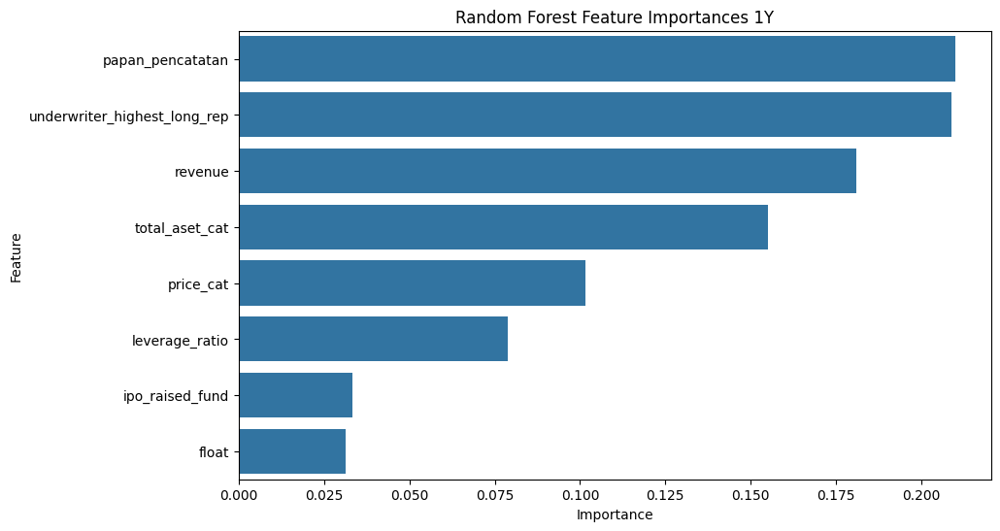

In [132]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train, y_train)

importances = rf.feature_importances_
importances = pd.Series(importances, index=X_train.columns)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1y'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Random Forest Feature Importances 1Y")
plt.show()

#### TabPFN

In [133]:
import torch
from tabpfn import TabPFNClassifier

clf = TabPFNClassifier(device="cuda" if torch.cuda.is_available() else "cpu")

clf.fit(X_train, y_train)

TabPFNClassifier(device='cpu')

In [134]:
y_pred = clf.predict(X_test)

In [135]:
thresholds = np.arange(0.3, 0.61, 0.01)
f1_scores = []

probs = cross_val_predict(
    clf,
    X, y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    method='predict_proba'
)[:, 1]

for t in thresholds:
    preds = (probs >= t).astype(int)
    score = f1_score(y, preds, average='macro')
    f1_scores.append(score)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Best F1 Macro Score: {best_f1:.4f}")

Best Threshold: 0.41
Best F1 Macro Score: 0.7028


Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        24
           1       0.73      0.73      0.73        15

    accuracy                           0.79        39
   macro avg       0.78      0.78      0.78        39
weighted avg       0.79      0.79      0.79        39



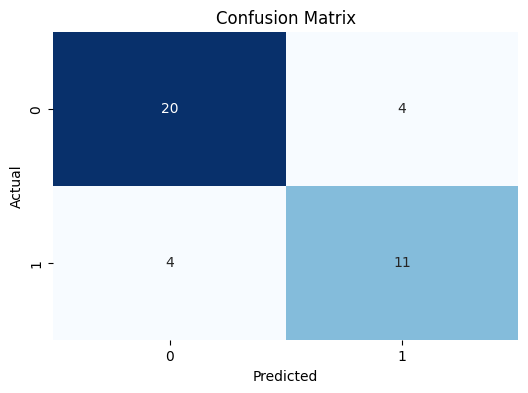

In [136]:
probs = clf.predict_proba(X_test)[:, 1]
y_pred = (probs > best_threshold).astype(int)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

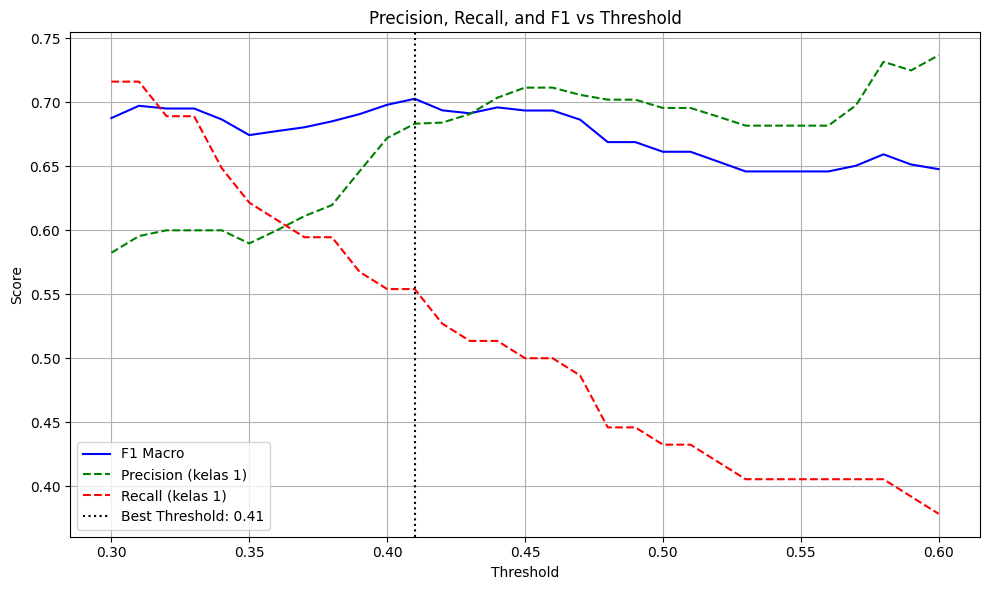

In [137]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
probs = cross_val_predict(
    clf,
    X, y,
    cv=cv,
    method='predict_proba'
)[:, 1]

f1_scores = []
precisions = []
recalls = []

for t in thresholds:
    preds = (probs >= t).astype(int)
    f1_scores.append(f1_score(y, preds, average='macro'))
    precisions.append(precision_score(y, preds))
    recalls.append(recall_score(y, preds))

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, label='F1 Macro', color='blue')
plt.plot(thresholds, precisions, label='Precision (kelas 1)', linestyle='--', color='green')
plt.plot(thresholds, recalls, label='Recall (kelas 1)', linestyle='--', color='red')
plt.axvline(best_threshold, linestyle=':', color='black', label=f'Best Threshold: {best_threshold:.2f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 vs Threshold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

F1 Score (threshold=0.4100000000000001): 0.7028
Accuracy: 0.7305699481865285
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.84      0.79       119
           1       0.68      0.55      0.61        74

    accuracy                           0.73       193
   macro avg       0.72      0.70      0.70       193
weighted avg       0.73      0.73      0.72       193



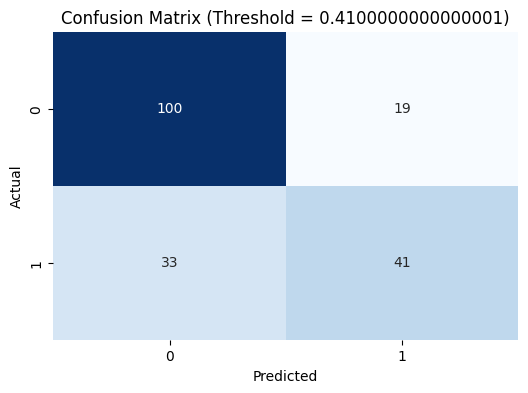

In [138]:
threshold = best_threshold
preds = (probs >= threshold).astype(int)

cm = confusion_matrix(y, preds)
print(f"F1 Score (threshold={threshold}): {f1_score(y, preds, average='macro'):.4f}")
print(f"Accuracy: {accuracy_score(y, preds)}")
print(f"Classification Report:\n{classification_report(y, preds)}")

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix (Threshold = {threshold})')
plt.show()

In [139]:
import joblib

with open('tabPFN_1Y.pkl', 'wb') as f:
    joblib.dump(clf, f)

#### Tabnet

In [140]:
features_to_use['1y']

['papan_pencatatan',
 'underwriter_highest_long_rep',
 'revenue',
 'total_aset_cat',
 'price_cat',
 'leverage_ratio',
 'ipo_raised_fund',
 'float']

In [141]:
def is_categorical(df: pd.DataFrame, column: str) -> bool:
    if df[column].dtype == 'object':
      return True

    if pd.api.types.is_numeric_dtype(df[column]):
      unique_count = df[column].nunique()
      total_count = len(df[column])
      if total_count > 0 and (unique_count / total_count) < 0.2:
        return True

    return False

In [142]:
categorical_cols = []
numerical_cols = []

cols_to_ignore = ['1d', '1w', '1m', '6m', '1y']

for col in features_to_use['1y']:
    if col in cols_to_ignore:
        continue

    if is_categorical(df_custom, col):
        categorical_cols.append(col)
    else:
        numerical_cols.append(col)

In [143]:
features_to_use['1y']

['papan_pencatatan',
 'underwriter_highest_long_rep',
 'revenue',
 'total_aset_cat',
 'price_cat',
 'leverage_ratio',
 'ipo_raised_fund',
 'float']

In [144]:
categorical_cols

['papan_pencatatan',
 'underwriter_highest_long_rep',
 'total_aset_cat',
 'price_cat']

In [145]:
numerical_cols

['revenue', 'leverage_ratio', 'ipo_raised_fund', 'float']

In [146]:
df_tabnet = df_custom[df_custom['1y'] != 1].copy()

X = df_tabnet[features_to_use['1y']].copy()
y = df_tabnet['1y'].astype(int).values

y[y == 2] = 1

encoder = OrdinalEncoder()
X[categorical_cols] = encoder.fit_transform(X[categorical_cols])
X = X.values.astype(np.float32)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [147]:
from pytorch_tabnet.tab_model import TabNetClassifier

tabnet_clf = TabNetClassifier(
    seed=42,
    verbose=1
)

tabnet_clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_test, y_test)],
    eval_name=["val"],
    eval_metric=["balanced_accuracy"],
    max_epochs=200,
    patience=20,
    batch_size=16
)

ModuleNotFoundError: No module named 'pytorch_tabnet'

Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        24
           1       1.00      0.60      0.75        15

    accuracy                           0.85        39
   macro avg       0.90      0.80      0.82        39
weighted avg       0.88      0.85      0.84        39



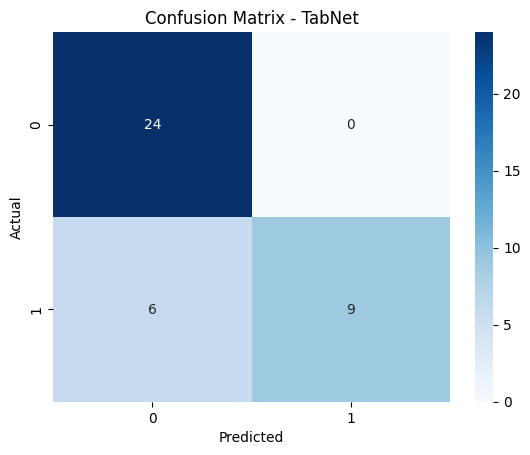

In [ ]:
y_pred = tabnet_clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

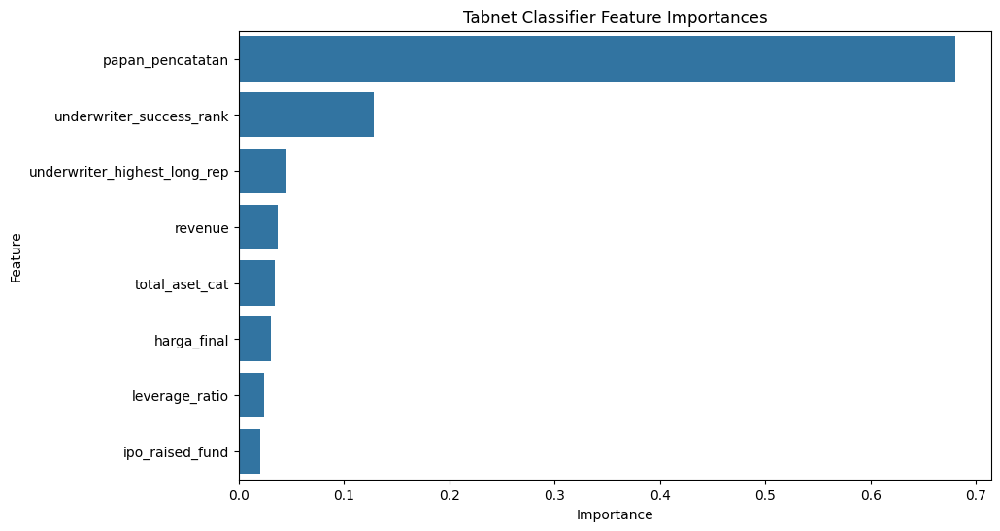

In [ ]:
importances = tabnet_clf.feature_importances_
importances = pd.Series(importances)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1y'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Tabnet Classifier Feature Importances")
plt.show()

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import StandardScaler

X[:, -len(numerical_cols):] = StandardScaler().fit_transform(X[:, -len(numerical_cols):])

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_preds = []
y_true = []

for train_idx, test_idx in cv.split(X_resampled, y_resampled):
    X_tr, X_te = X_resampled[train_idx], X_resampled[test_idx]
    y_tr, y_te = y_resampled[train_idx], y_resampled[test_idx]

    model = TabNetClassifier(
        seed=42,
        verbose=10,
    )

    model.fit(
        X_train=X_tr, y_train=y_tr,
        eval_set=[(X_te, y_te)],
        eval_name=["val"],
        eval_metric=["balanced_accuracy"],
        batch_size=16,
    )

    y_preds.extend(model.predict(X_te))
    y_true.extend(y_te)

print(classification_report(y_true, y_preds))

epoch 0  | loss: 0.759   | val_balanced_accuracy: 0.5     |  0:00:00s
epoch 10 | loss: 0.49116 | val_balanced_accuracy: 0.625   |  0:00:03s

Early stopping occurred at epoch 18 with best_epoch = 8 and best_val_balanced_accuracy = 0.75
epoch 0  | loss: 0.84944 | val_balanced_accuracy: 0.60417 |  0:00:00s
epoch 10 | loss: 0.55104 | val_balanced_accuracy: 0.72917 |  0:00:03s
epoch 20 | loss: 0.51686 | val_balanced_accuracy: 0.75    |  0:00:06s
epoch 30 | loss: 0.51411 | val_balanced_accuracy: 0.79167 |  0:00:09s

Early stopping occurred at epoch 39 with best_epoch = 29 and best_val_balanced_accuracy = 0.8125
epoch 0  | loss: 0.8075  | val_balanced_accuracy: 0.5625  |  0:00:00s
epoch 10 | loss: 0.529   | val_balanced_accuracy: 0.70833 |  0:00:03s
epoch 20 | loss: 0.47604 | val_balanced_accuracy: 0.6875  |  0:00:05s

Early stopping occurred at epoch 28 with best_epoch = 18 and best_val_balanced_accuracy = 0.75
epoch 0  | loss: 0.73582 | val_balanced_accuracy: 0.42844 |  0:00:00s
epoch 10 | 

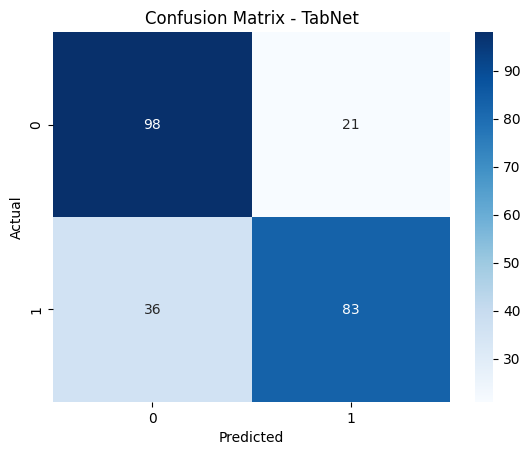

In [ ]:
cm = confusion_matrix(y_true, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

In [ ]:
import joblib

with open('tabnet_1Y.pkl', 'wb') as f:
    joblib.dump(tabnet_clf, f)

#### LIME Explanation for TabPFN 1Y

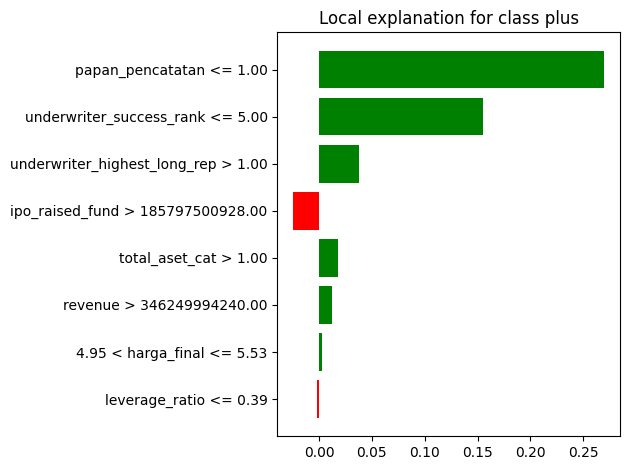

In [ ]:
explain_with_lime(
    model=clf,
    X_train=pd.DataFrame(X_train, columns=features_to_use['1y']),
    X_test=pd.DataFrame(X_test, columns=features_to_use['1y']),
    feature_names=features_to_use['1y'],
    class_names=['minus', 'plus']
)

#### LIME Explanation for Tabnet 1Y

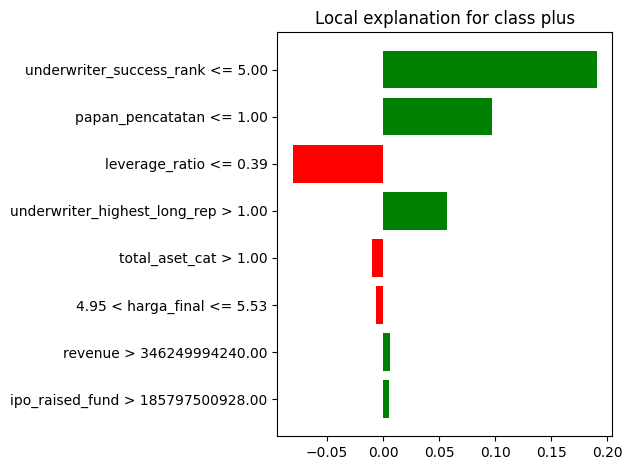

In [ ]:
explain_with_lime(
    model=tabnet_clf,
    X_train=pd.DataFrame(X_train, columns=features_to_use['1y']),
    X_test=pd.DataFrame(X_test, columns=features_to_use['1y']),
    feature_names=features_to_use['1y'],
    class_names=['minus', 'plus']
)

In [ ]:
explain_and_save_lime_pngs(
    model=tabnet_clf,
    X_train=X_train,
    X_test=X_test,
    feature_names=features_to_use['1y'],
    class_names=['plus', 'minus'],
    sample_index=0,
    filename_prefix="analisis_ipo"
)

Membuat penjelasan LIME untuk sampel ke-0...
-> Plot untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_plot.png
-> Tabel untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_tabel.png
-> Plot untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_plot.png
-> Tabel untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_tabel.png

✅ Semua file PNG berhasil dibuat.


### 1D %

In [ ]:
X = df_custom[features_to_use['1d']]
y = df_custom['1d']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=5)

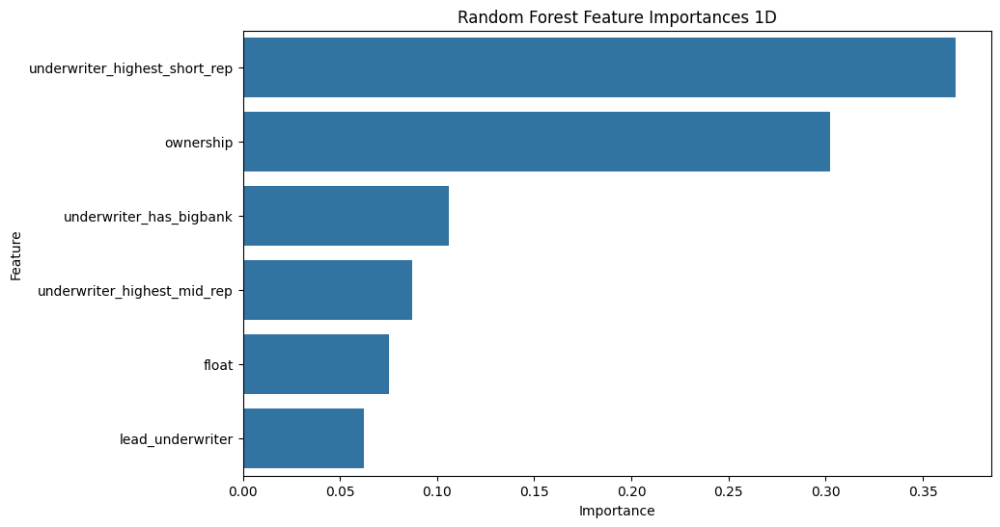

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train, y_train)

importances = rf.feature_importances_
importances = pd.Series(importances, index=X_train.columns)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1d'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Random Forest Feature Importances 1D")
plt.show()

#### TabPFN

In [ ]:
clf = TabPFNClassifier(device="cuda" if torch.cuda.is_available() else "cpu")

clf.fit(X_train, y_train)

TabPFNClassifier(device='cpu')

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
thresholds = np.arange(0.3, 0.61, 0.01)
f1_scores = []

probs = cross_val_predict(
    clf,
    X, y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    method='predict_proba'
)[:, 1]

for t in thresholds:
    preds = (probs >= t).astype(int)
    score = f1_score(y, preds, average='macro')
    f1_scores.append(score)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Best F1 Macro Score: {best_f1:.4f}")

Best Threshold: 0.30
Best F1 Macro Score: 0.3679


Classification Report:
              precision    recall  f1-score   support

           0       0.60      1.00      0.75        24
           1       0.80      0.44      0.57         9
           2       0.00      0.00      0.00        12

    accuracy                           0.62        45
   macro avg       0.47      0.48      0.44        45
weighted avg       0.48      0.62      0.51        45



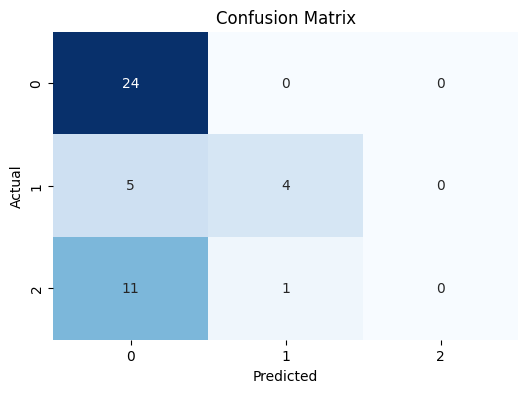

In [ ]:
probs = clf.predict_proba(X_test)[:, 1]
y_pred = (probs > best_threshold).astype(int)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.55      1.00      0.71       117
           1       0.58      0.16      0.25        44
           2       0.00      0.00      0.00        62

    accuracy                           0.56       223
   macro avg       0.38      0.39      0.32       223
weighted avg       0.41      0.56      0.42       223



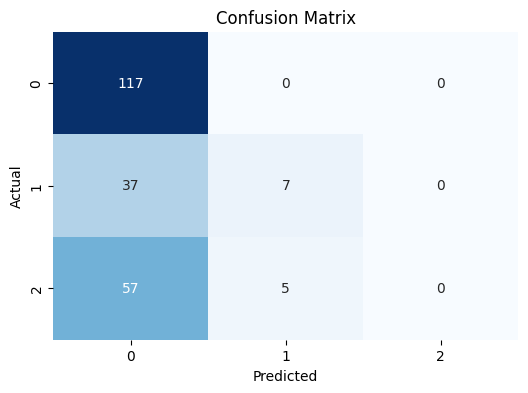

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
probs = cross_val_predict(
    clf,
    X, y,
    cv=cv,
    method='predict_proba'
)[:, 1]

y_pred = (probs > 0.5).astype(int)

print("Classification Report:")
print(classification_report(y, y_pred))

cm = confusion_matrix(y, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import joblib

with open('tabPFN_1D.pkl', 'wb') as f:
    joblib.dump(clf, f)

#### Tabnet

In [ ]:
categorical_cols_1d = []
numerical_cols_1d = []

for col in features_to_use['1d']:
    if is_categorical(df_custom, col):
        categorical_cols_1d.append(col)
    else:
        numerical_cols_1d.append(col)

print(f"Categorical Columns for 1D: {categorical_cols_1d}")
print(f"Numerical Columns for 1D: {numerical_cols_1d}")

Categorical Columns for 1D: ['underwriter_highest_short_rep', 'ownership', 'underwriter_has_bigbank', 'underwriter_highest_mid_rep', 'lead_underwriter']
Numerical Columns for 1D: ['float']


In [ ]:
df_tabnet = df_custom.copy()

X = df_tabnet[features_to_use['1d']].copy()
y = df_tabnet['1d'].astype(int).values

encoder = OrdinalEncoder()
X[categorical_cols_1d] = encoder.fit_transform(X[categorical_cols_1d])
X = X.values.astype(np.float32)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
from torch.utils.data.sampler import WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight

classes = np.unique(y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)

class_weights_tensor = torch.FloatTensor(weights)

loss_function = torch.nn.CrossEntropyLoss(weight=class_weights_tensor)

In [ ]:
tabnet_clf = TabNetClassifier(
    n_d=16,
    n_a=16,
    n_steps=5,
    gamma=1.5,
    lambda_sparse=1e-4,
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=2e-2),
    scheduler_params={"mode": "min", "patience": 5, "factor": 0.5},
    scheduler_fn=torch.optim.lr_scheduler.ReduceLROnPlateau,
    seed=42,
    verbose=1
)

tabnet_clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_test, y_test)],
    eval_name=["val"],
    eval_metric=["balanced_accuracy"],
    max_epochs=200,
    patience=20,
    batch_size=32,
)

epoch 0  | loss: 1.49568 | val_balanced_accuracy: 0.28704 |  0:00:00s
epoch 1  | loss: 1.21315 | val_balanced_accuracy: 0.36111 |  0:00:00s
epoch 2  | loss: 0.93642 | val_balanced_accuracy: 0.35648 |  0:00:00s
epoch 3  | loss: 1.0851  | val_balanced_accuracy: 0.31944 |  0:00:01s
epoch 4  | loss: 1.00283 | val_balanced_accuracy: 0.33333 |  0:00:01s
epoch 5  | loss: 0.94465 | val_balanced_accuracy: 0.30556 |  0:00:01s
epoch 6  | loss: 0.91873 | val_balanced_accuracy: 0.36111 |  0:00:02s
epoch 7  | loss: 0.84543 | val_balanced_accuracy: 0.31944 |  0:00:02s
epoch 8  | loss: 0.85683 | val_balanced_accuracy: 0.3287  |  0:00:02s
epoch 9  | loss: 0.94829 | val_balanced_accuracy: 0.35648 |  0:00:03s
epoch 10 | loss: 0.84839 | val_balanced_accuracy: 0.31481 |  0:00:03s
epoch 11 | loss: 0.86251 | val_balanced_accuracy: 0.31481 |  0:00:03s
epoch 12 | loss: 0.79783 | val_balanced_accuracy: 0.35648 |  0:00:03s
epoch 13 | loss: 0.83445 | val_balanced_accuracy: 0.34259 |  0:00:04s
epoch 14 | loss: 0.8

Classification Report:
              precision    recall  f1-score   support

           0       0.63      1.00      0.77        24
           1       0.33      0.11      0.17         9
           2       0.75      0.25      0.38        12

    accuracy                           0.62        45
   macro avg       0.57      0.45      0.44        45
weighted avg       0.60      0.62      0.55        45



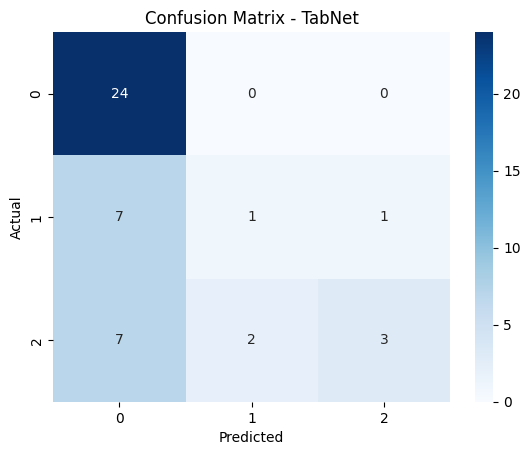

In [ ]:
y_pred = tabnet_clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

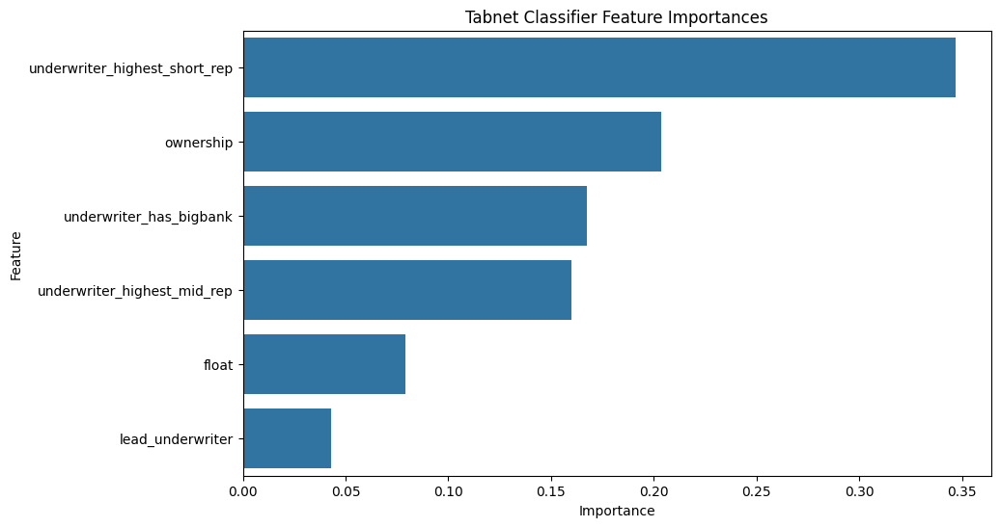

In [ ]:
importances = tabnet_clf.feature_importances_
importances = pd.Series(importances)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1d'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Tabnet Classifier Feature Importances")
plt.show()

In [ ]:
X[:, -len(numerical_cols):] = StandardScaler().fit_transform(X[:, -len(numerical_cols):])

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_preds = []
y_true = []

for train_idx, test_idx in cv.split(X_resampled, y_resampled):
    X_tr, X_te = X_resampled[train_idx], X_resampled[test_idx]
    y_tr, y_te = y_resampled[train_idx], y_resampled[test_idx]

    model = TabNetClassifier(
        seed=42,
        verbose=10,
    )

    model.fit(
        X_train=X_tr, y_train=y_tr,
        eval_set=[(X_te, y_te)],
        eval_name=["val"],
        eval_metric=["balanced_accuracy"],
        batch_size=16,
    )

    y_preds.extend(model.predict(X_te))
    y_true.extend(y_te)

print(classification_report(y_true, y_preds))

epoch 0  | loss: 1.2215  | val_balanced_accuracy: 0.33514 |  0:00:00s
epoch 10 | loss: 0.93419 | val_balanced_accuracy: 0.54891 |  0:00:05s
epoch 20 | loss: 0.91127 | val_balanced_accuracy: 0.56461 |  0:00:10s
epoch 30 | loss: 0.89158 | val_balanced_accuracy: 0.56401 |  0:00:17s

Early stopping occurred at epoch 33 with best_epoch = 23 and best_val_balanced_accuracy = 0.61896
epoch 0  | loss: 1.12876 | val_balanced_accuracy: 0.39674 |  0:00:00s
epoch 10 | loss: 1.00134 | val_balanced_accuracy: 0.54469 |  0:00:05s
epoch 20 | loss: 0.94092 | val_balanced_accuracy: 0.45894 |  0:00:10s

Early stopping occurred at epoch 20 with best_epoch = 10 and best_val_balanced_accuracy = 0.54469
epoch 0  | loss: 1.22609 | val_balanced_accuracy: 0.31461 |  0:00:00s
epoch 10 | loss: 0.99426 | val_balanced_accuracy: 0.47222 |  0:00:05s
epoch 20 | loss: 0.97464 | val_balanced_accuracy: 0.45773 |  0:00:10s

Early stopping occurred at epoch 25 with best_epoch = 15 and best_val_balanced_accuracy = 0.58333
epo

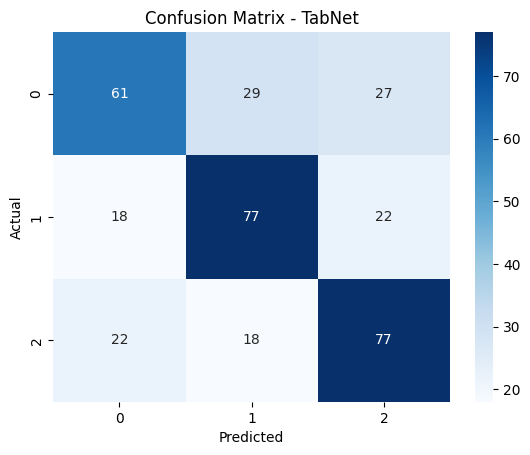

In [ ]:
cm = confusion_matrix(y_true, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

In [ ]:
import joblib

with open('tabnet_1D.pkl', 'wb') as f:
    joblib.dump(tabnet_clf, f)

#### LIME Explanation for TabPFN 1D

In [ ]:
# explain_multiclass_with_lime(
#     model=clf,
#     X_train=pd.DataFrame(X_train, columns=features_to_use['1d']),
#     X_test=pd.DataFrame(X_test, columns=features_to_use['1d']),
#     feature_names=features_to_use['1d'],
#     class_names=['ARA', 'plus', 'minus']
# )

#### LIME Explanation for Tabnet 1D


Penjelasan untuk Kelas: ARA


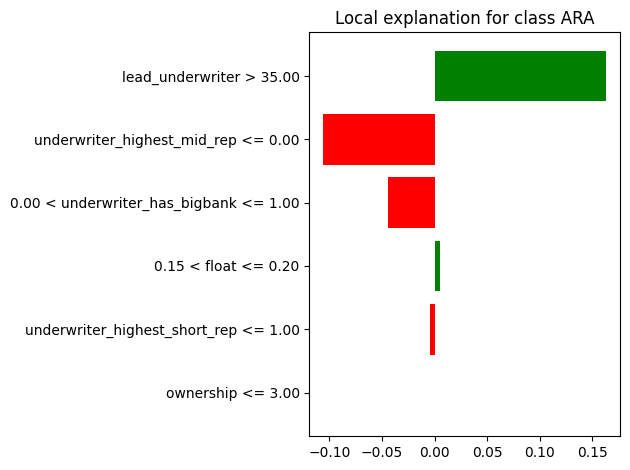


Penjelasan untuk Kelas: plus


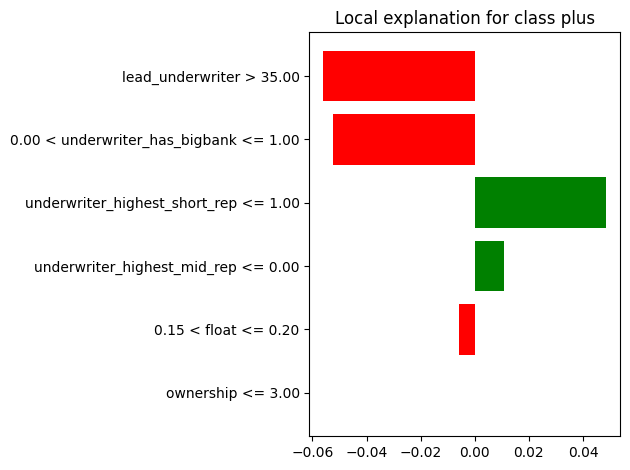


Penjelasan untuk Kelas: minus


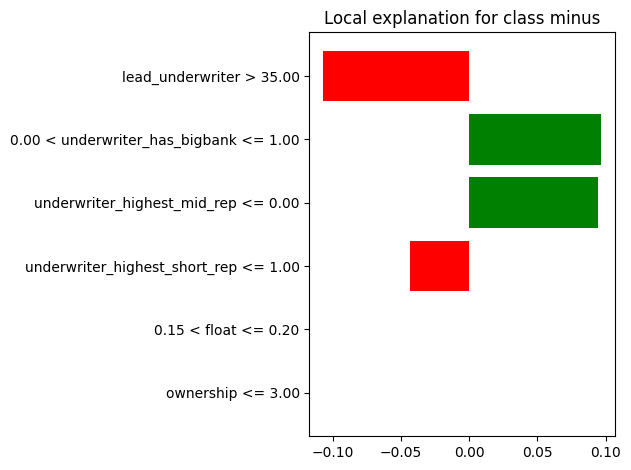

In [ ]:
explain_multiclass_with_lime(
    model=tabnet_clf,
    X_train=pd.DataFrame(X_train, columns=features_to_use['1d']),
    X_test=pd.DataFrame(X_test, columns=features_to_use['1d']),
    feature_names=features_to_use['1d'],
    class_names=['ARA', 'plus', 'minus']
)

In [ ]:
explain_and_save_lime_pngs(
    model=tabnet_clf,
    X_train=X_train,
    X_test=X_test,
    feature_names=features_to_use['1d'],
    class_names=['ARA', 'plus', 'minus'],
    sample_index=0,
    filename_prefix="analisis_ipo"
)

Membuat penjelasan LIME untuk sampel ke-0...
-> Plot untuk kelas 'ARA' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_ARA_plot.png
-> Tabel untuk kelas 'ARA' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_ARA_tabel.png
-> Plot untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_plot.png
-> Tabel untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_tabel.png
-> Plot untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_plot.png
-> Tabel untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_tabel.png

✅ Semua file PNG berhasil dibuat.


### 1W %

In [ ]:
df_custom['1w'].value_counts()

,count
1w,
1,138
0,85


In [ ]:
X = df_custom[features_to_use['1w']].copy()
y = df_custom['1w'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=5)

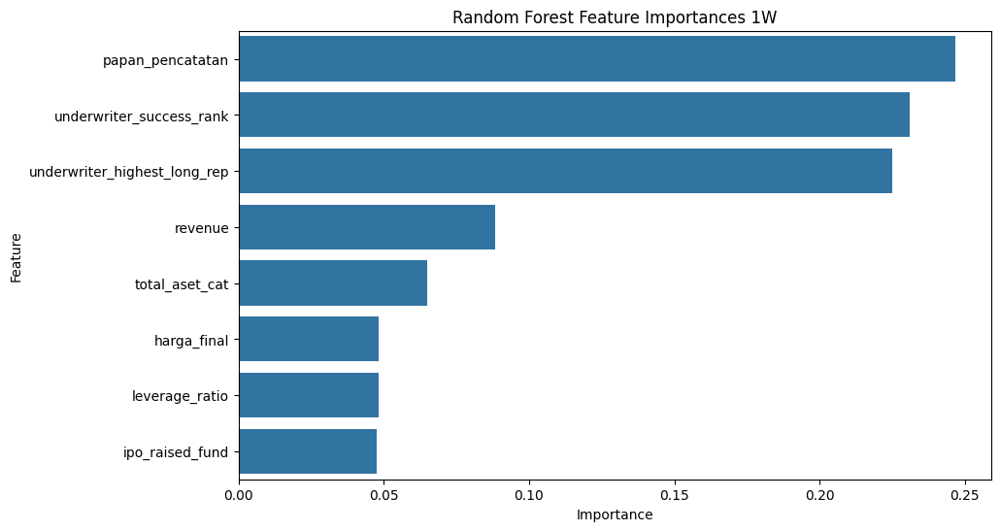

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train, y_train)

importances = rf.feature_importances_
importances = pd.Series(importances, index=X_train.columns)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1w'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Random Forest Feature Importances 1W")
plt.show()

#### TabPFN

In [ ]:
clf = TabPFNClassifier(device="cuda" if torch.cuda.is_available() else "cpu")

clf.fit(X_train, y_train)

TabPFNClassifier(device='cpu')

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
thresholds = np.arange(0.3, 0.61, 0.01)
f1_scores = []

probs = cross_val_predict(
    clf,
    X, y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    method='predict_proba'
)[:, 1]

for t in thresholds:
    preds = (probs >= t).astype(int)
    score = f1_score(y, preds, average='macro')
    f1_scores.append(score)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Best F1 Macro Score: {best_f1:.4f}")

Best Threshold: 0.57
Best F1 Macro Score: 0.6145


F1 Score (threshold=0.5700000000000003): 0.6145
Accuracy: 0.6547085201793722


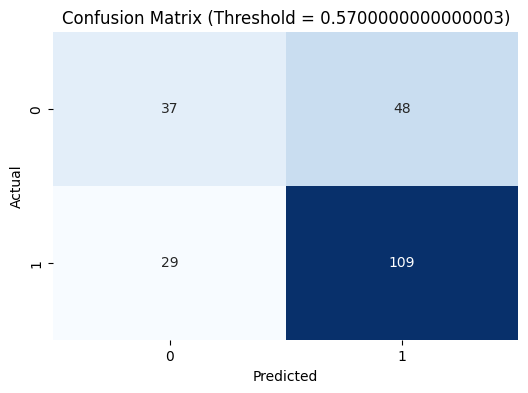

In [ ]:
threshold = best_threshold
preds = (probs >= threshold).astype(int)

cm = confusion_matrix(y, preds)
print(f"F1 Score (threshold={threshold}): {f1_score(y, preds, average='macro'):.4f}")
print(f"Accuracy: {accuracy_score(y, preds)}")

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix (Threshold = {threshold})')
plt.show()

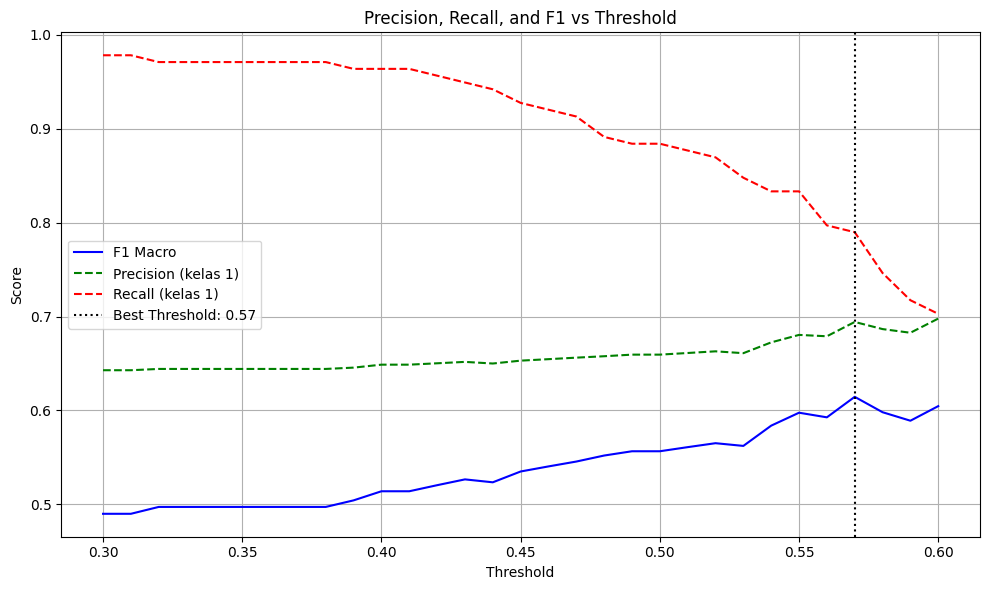

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
probs = cross_val_predict(
    clf,
    X, y,
    cv=cv,
    method='predict_proba'
)[:, 1]

f1_scores = []
precisions = []
recalls = []

for t in thresholds:
    preds = (probs >= t).astype(int)
    f1_scores.append(f1_score(y, preds, average='macro'))
    precisions.append(precision_score(y, preds))
    recalls.append(recall_score(y, preds))

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, label='F1 Macro', color='blue')
plt.plot(thresholds, precisions, label='Precision (kelas 1)', linestyle='--', color='green')
plt.plot(thresholds, recalls, label='Recall (kelas 1)', linestyle='--', color='red')
plt.axvline(best_threshold, linestyle=':', color='black', label=f'Best Threshold: {best_threshold:.2f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 vs Threshold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

F1 Score (threshold=0.5700000000000003): 0.6145
Accuracy: 0.6547085201793722
Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.44      0.49        85
           1       0.69      0.79      0.74       138

    accuracy                           0.65       223
   macro avg       0.63      0.61      0.61       223
weighted avg       0.64      0.65      0.64       223



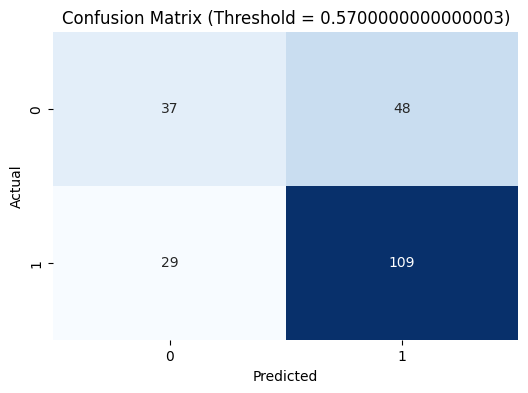

In [ ]:
threshold = best_threshold
preds = (probs >= threshold).astype(int)

cm = confusion_matrix(y, preds)
print(f"F1 Score (threshold={threshold}): {f1_score(y, preds, average='macro'):.4f}")
print(f"Accuracy: {accuracy_score(y, preds)}")
print(f"Classification Report:")
print(classification_report(y, preds))

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix (Threshold = {threshold})')
plt.show()

In [ ]:
import joblib

with open('tabPFN_1W.pkl', 'wb') as f:
    joblib.dump(clf, f)

#### Tabnet

In [ ]:
features_to_use['1w']

['underwriter_highest_short_rep',
 'underwriter_highest_mid_rep',
 'total_aset_cat',
 'papan_pencatatan',
 'ipo_raised_fund',
 'revenue',
 'leverage_ratio',
 'underwriter_avg_aset_cat']

In [ ]:
categorical_cols_1w = []
numerical_cols_1w = []

for col in features_to_use['1w']:
    if is_categorical(df_custom, col):
        categorical_cols_1w.append(col)
    else:
        numerical_cols_1w.append(col)

print(f"Categorical Columns for 1w: {categorical_cols_1w}")
print(f"Numerical Columns for 1w: {numerical_cols_1w}")

Categorical Columns for 1w: ['underwriter_highest_short_rep', 'underwriter_highest_mid_rep', 'total_aset_cat', 'papan_pencatatan', 'underwriter_avg_aset_cat']
Numerical Columns for 1w: ['ipo_raised_fund', 'revenue', 'leverage_ratio']


In [ ]:
df_tabnet = df_custom.copy()

X = df_tabnet[features_to_use['1w']].copy()
y = df_tabnet['1w'].astype(int).values

encoder = OrdinalEncoder()
X[categorical_cols_1w] = encoder.fit_transform(X[categorical_cols_1w])
X = X.values.astype(np.float32)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
tabnet_clf = TabNetClassifier(
    seed=42,
    verbose=1
)

tabnet_clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_test, y_test)],
    eval_name=["val"],
    eval_metric=["balanced_accuracy"],
    max_epochs=200,
    patience=20,
    batch_size=32
)

epoch 0  | loss: 0.87421 | val_balanced_accuracy: 0.54622 |  0:00:00s
epoch 1  | loss: 0.72284 | val_balanced_accuracy: 0.5     |  0:00:00s
epoch 2  | loss: 0.73236 | val_balanced_accuracy: 0.52941 |  0:00:00s
epoch 3  | loss: 0.68095 | val_balanced_accuracy: 0.57038 |  0:00:00s
epoch 4  | loss: 0.7052  | val_balanced_accuracy: 0.52311 |  0:00:00s
epoch 5  | loss: 0.57854 | val_balanced_accuracy: 0.47584 |  0:00:00s
epoch 6  | loss: 0.58915 | val_balanced_accuracy: 0.46429 |  0:00:01s
epoch 7  | loss: 0.57483 | val_balanced_accuracy: 0.46429 |  0:00:01s
epoch 8  | loss: 0.53605 | val_balanced_accuracy: 0.50525 |  0:00:01s
epoch 9  | loss: 0.52856 | val_balanced_accuracy: 0.56408 |  0:00:01s
epoch 10 | loss: 0.51515 | val_balanced_accuracy: 0.64076 |  0:00:01s
epoch 11 | loss: 0.55287 | val_balanced_accuracy: 0.64076 |  0:00:01s
epoch 12 | loss: 0.55471 | val_balanced_accuracy: 0.56933 |  0:00:01s
epoch 13 | loss: 0.55378 | val_balanced_accuracy: 0.55147 |  0:00:02s
epoch 14 | loss: 0.5

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.65      0.69        17
           1       0.80      0.86      0.83        28

    accuracy                           0.78        45
   macro avg       0.77      0.75      0.76        45
weighted avg       0.77      0.78      0.77        45



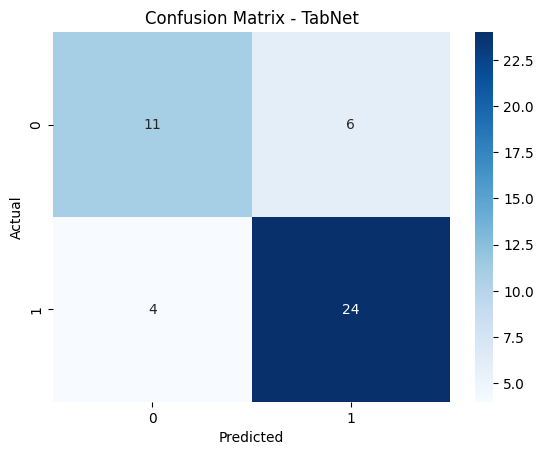

In [ ]:
y_pred = tabnet_clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

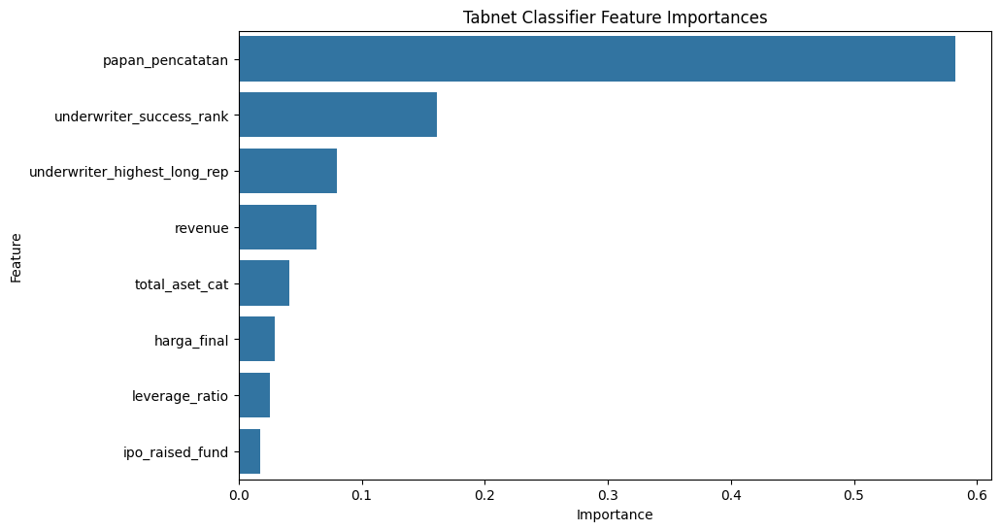

In [ ]:
importances = tabnet_clf.feature_importances_
importances = pd.Series(importances)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1y'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Tabnet Classifier Feature Importances")
plt.show()

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import StandardScaler

X[:, -len(numerical_cols):] = StandardScaler().fit_transform(X[:, -len(numerical_cols):])

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_preds = []
y_true = []

for train_idx, test_idx in cv.split(X_resampled, y_resampled):
    X_tr, X_te = X_resampled[train_idx], X_resampled[test_idx]
    y_tr, y_te = y_resampled[train_idx], y_resampled[test_idx]

    model = TabNetClassifier(
        seed=42,
        verbose=10,
    )

    model.fit(
        X_train=X_tr, y_train=y_tr,
        eval_set=[(X_te, y_te)],
        eval_name=["val"],
        eval_metric=["balanced_accuracy"],
        batch_size=48,
    )

    y_preds.extend(model.predict(X_te))
    y_true.extend(y_te)

print(classification_report(y_true, y_preds))

epoch 0  | loss: 0.87853 | val_balanced_accuracy: 0.5     |  0:00:00s
epoch 10 | loss: 0.63756 | val_balanced_accuracy: 0.625   |  0:00:01s

Early stopping occurred at epoch 15 with best_epoch = 5 and best_val_balanced_accuracy = 0.66071
epoch 0  | loss: 0.79123 | val_balanced_accuracy: 0.49405 |  0:00:00s
epoch 10 | loss: 0.61134 | val_balanced_accuracy: 0.69378 |  0:00:01s
epoch 20 | loss: 0.56718 | val_balanced_accuracy: 0.65608 |  0:00:03s

Early stopping occurred at epoch 22 with best_epoch = 12 and best_val_balanced_accuracy = 0.71296
epoch 0  | loss: 0.92741 | val_balanced_accuracy: 0.49272 |  0:00:00s
epoch 10 | loss: 0.57419 | val_balanced_accuracy: 0.54233 |  0:00:01s

Early stopping occurred at epoch 18 with best_epoch = 8 and best_val_balanced_accuracy = 0.60185
epoch 0  | loss: 0.95477 | val_balanced_accuracy: 0.5463  |  0:00:00s
epoch 10 | loss: 0.60108 | val_balanced_accuracy: 0.54497 |  0:00:01s
epoch 20 | loss: 0.57027 | val_balanced_accuracy: 0.67725 |  0:00:03s
epoch

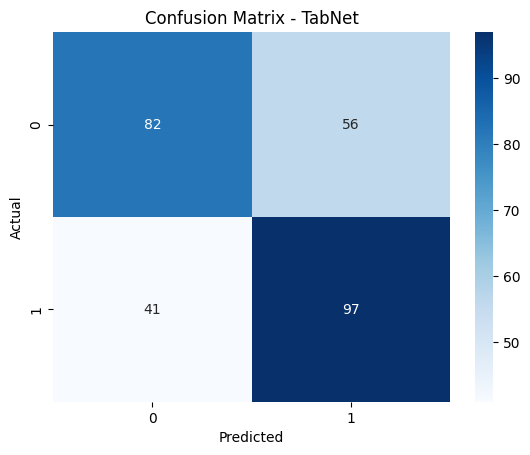

In [ ]:
cm = confusion_matrix(y_true, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

In [ ]:
import joblib

with open('tabnet_1W.pkl', 'wb') as f:
    joblib.dump(tabnet_clf, f)

#### LIME Explanation for TabPFN 1W

In [ ]:
# explain_with_lime(
#     model=clf,
#     X_train=pd.DataFrame(X_train, columns=features_to_use['1w']),
#     X_test=pd.DataFrame(X_test, columns=features_to_use['1w']),
#     feature_names=features_to_use['1w'],
#     class_names=['minus', 'plus']
# )

#### LIME Explanation for Tabnet 1W

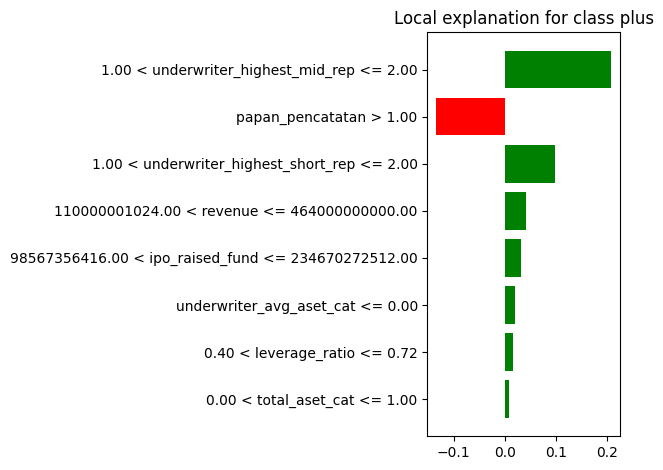

In [ ]:
explain_with_lime(
    model=tabnet_clf,
    X_train=pd.DataFrame(X_train, columns=features_to_use['1w']),
    X_test=pd.DataFrame(X_test, columns=features_to_use['1w']),
    feature_names=features_to_use['1w'],
    class_names=['minus', 'plus']
)

In [ ]:
explain_and_save_lime_pngs(
    model=tabnet_clf,
    X_train=X_train,
    X_test=X_test,
    feature_names=features_to_use['1w'],
    class_names=['minus', 'plus'],
    sample_index=0,
    filename_prefix="analisis_ipo"
)

Membuat penjelasan LIME untuk sampel ke-0...
-> Plot untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_plot.png
-> Tabel untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_tabel.png
-> Plot untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_plot.png
-> Tabel untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_tabel.png

✅ Semua file PNG berhasil dibuat.


### 1M %

In [ ]:
df_custom['1m'].value_counts()

,count
1m,
1,118
0,103
2,2


In [ ]:
X = df_custom[features_to_use['1m']].copy()
y = df_custom['1m'].copy()

X = X[y != 2]
y = y[y != 2]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=5)

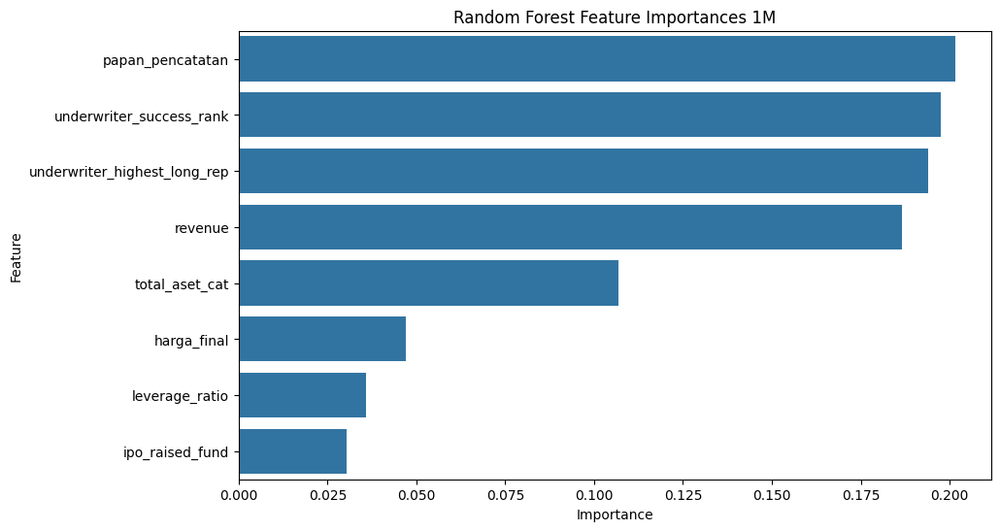

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train, y_train)

importances = rf.feature_importances_
importances = pd.Series(importances, index=X_train.columns)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1m'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Random Forest Feature Importances 1M")
plt.show()

#### TabPFN

In [ ]:
clf = TabPFNClassifier(device="cuda" if torch.cuda.is_available() else "cpu")

clf.fit(X_train, y_train)

TabPFNClassifier(device='cpu')

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
thresholds = np.arange(0.3, 0.61, 0.01)
f1_scores = []

probs = cross_val_predict(
    clf,
    X, y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    method='predict_proba'
)[:, 1]

for t in thresholds:
    preds = (probs >= t).astype(int)
    score = f1_score(y, preds, average='macro')
    f1_scores.append(score)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Best F1 Macro Score: {best_f1:.4f}")

Best Threshold: 0.55
Best F1 Macro Score: 0.6650


Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.81      0.79        21
           1       0.83      0.79      0.81        24

    accuracy                           0.80        45
   macro avg       0.80      0.80      0.80        45
weighted avg       0.80      0.80      0.80        45



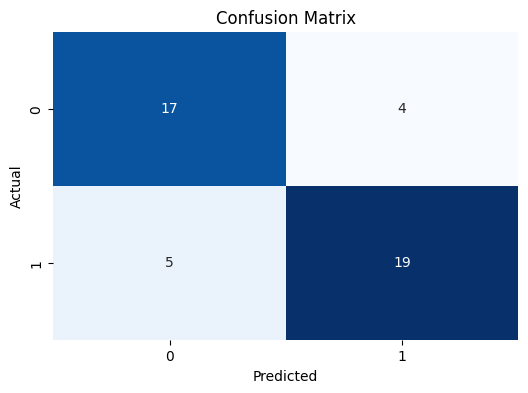

In [ ]:
probs = clf.predict_proba(X_test)[:, 1]
y_pred = (probs > best_threshold).astype(int)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

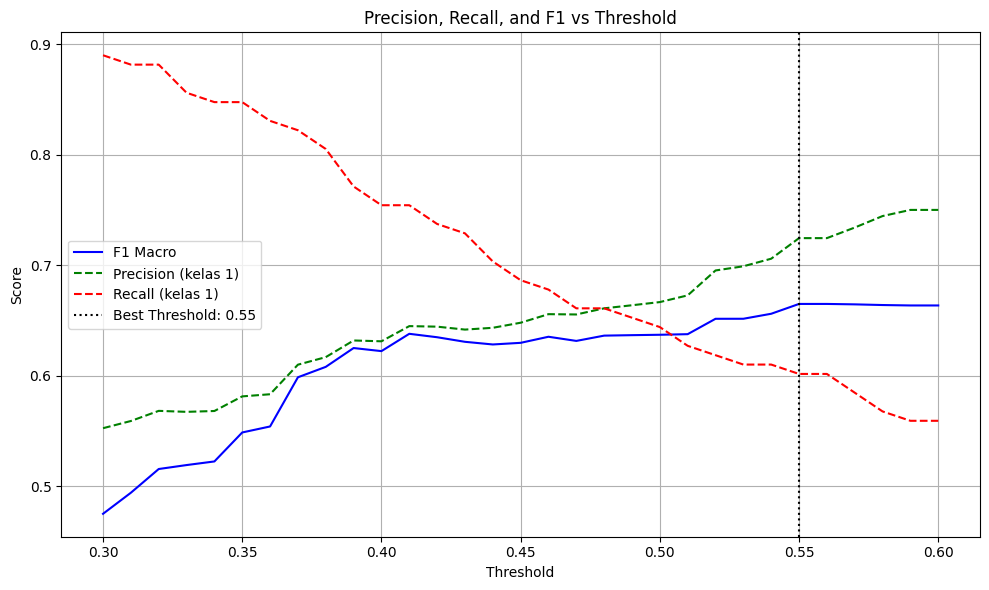

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
probs = cross_val_predict(
    clf,
    X, y,
    cv=cv,
    method='predict_proba'
)[:, 1]

f1_scores = []
precisions = []
recalls = []

for t in thresholds:
    preds = (probs >= t).astype(int)
    f1_scores.append(f1_score(y, preds, average='macro'))
    precisions.append(precision_score(y, preds))
    recalls.append(recall_score(y, preds))

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, label='F1 Macro', color='blue')
plt.plot(thresholds, precisions, label='Precision (kelas 1)', linestyle='--', color='green')
plt.plot(thresholds, recalls, label='Recall (kelas 1)', linestyle='--', color='red')
plt.axvline(best_threshold, linestyle=':', color='black', label=f'Best Threshold: {best_threshold:.2f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 vs Threshold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

F1 Score (threshold=0.5500000000000003): 0.6650
Accuracy: 0.665158371040724
Classification Report:

              precision    recall  f1-score   support

           0       0.62      0.74      0.67       103
           1       0.72      0.60      0.66       118

    accuracy                           0.67       221
   macro avg       0.67      0.67      0.66       221
weighted avg       0.67      0.67      0.66       221



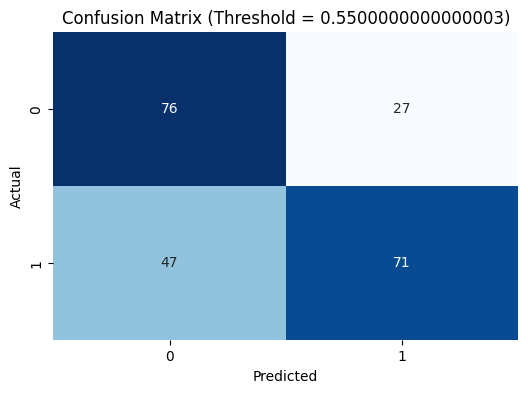

In [ ]:
threshold = best_threshold
preds = (probs >= threshold).astype(int)

cm = confusion_matrix(y, preds)
print(f"F1 Score (threshold={threshold}): {f1_score(y, preds, average='macro'):.4f}")
print(f"Accuracy: {accuracy_score(y, preds)}")
print("Classification Report:\n")
print(classification_report(y, preds))

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix (Threshold = {threshold})')
plt.show()

In [ ]:
import joblib

with open('tabPFN_1M.pkl', 'wb') as f:
    joblib.dump(clf, f)

#### Tabnet

In [ ]:
features_to_use['1m']

['underwriter_highest_mid_rep',
 'underwriter_highest_short_rep',
 'per',
 'leverage_ratio',
 'underwriter_freq_cat',
 'total_aset_cat',
 'ipo_raised_fund',
 'revenue']

In [ ]:
categorical_cols_1m = []
numerical_cols_1m = []

for col in features_to_use['1m']:
    if is_categorical(df_custom, col):
        categorical_cols_1m.append(col)
    else:
        numerical_cols_1m.append(col)

print(f"Categorical Columns for 1m: {categorical_cols_1m}")
print(f"Numerical Columns for 1m: {numerical_cols_1m}")

Categorical Columns for 1m: ['underwriter_highest_mid_rep', 'underwriter_highest_short_rep', 'underwriter_freq_cat', 'total_aset_cat']
Numerical Columns for 1m: ['per', 'leverage_ratio', 'ipo_raised_fund', 'revenue']


In [ ]:
df_custom['1m'].value_counts()

,count
1m,
1,118
0,103
2,2


In [ ]:
df_tabnet = df_custom[df_custom['1m'] != 2].copy()

X = df_tabnet[features_to_use['1m']].copy()
y = df_tabnet['1m'].astype(int).values

encoder = OrdinalEncoder()
X[categorical_cols_1m] = encoder.fit_transform(X[categorical_cols_1m])
X = X.values.astype(np.float32)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
tabnet_clf = TabNetClassifier(
    seed=42,
    verbose=1
)

tabnet_clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_test, y_test)],
    eval_name=["val"],
    eval_metric=["balanced_accuracy"],
    max_epochs=200,
    patience=20,
    batch_size=16
)

epoch 0  | loss: 0.8703  | val_balanced_accuracy: 0.56548 |  0:00:00s
epoch 1  | loss: 0.64608 | val_balanced_accuracy: 0.44643 |  0:00:00s
epoch 2  | loss: 0.68083 | val_balanced_accuracy: 0.61905 |  0:00:00s
epoch 3  | loss: 0.63083 | val_balanced_accuracy: 0.375   |  0:00:01s
epoch 4  | loss: 0.63995 | val_balanced_accuracy: 0.53869 |  0:00:01s
epoch 5  | loss: 0.69333 | val_balanced_accuracy: 0.53869 |  0:00:01s
epoch 6  | loss: 0.65755 | val_balanced_accuracy: 0.58036 |  0:00:02s
epoch 7  | loss: 0.62753 | val_balanced_accuracy: 0.53274 |  0:00:02s
epoch 8  | loss: 0.63053 | val_balanced_accuracy: 0.50893 |  0:00:03s
epoch 9  | loss: 0.59526 | val_balanced_accuracy: 0.5506  |  0:00:03s
epoch 10 | loss: 0.59948 | val_balanced_accuracy: 0.59226 |  0:00:03s
epoch 11 | loss: 0.59065 | val_balanced_accuracy: 0.5     |  0:00:04s
epoch 12 | loss: 0.60708 | val_balanced_accuracy: 0.53869 |  0:00:04s
epoch 13 | loss: 0.59732 | val_balanced_accuracy: 0.51786 |  0:00:05s
epoch 14 | loss: 0.5

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.71      0.71        21
           1       0.75      0.75      0.75        24

    accuracy                           0.73        45
   macro avg       0.73      0.73      0.73        45
weighted avg       0.73      0.73      0.73        45



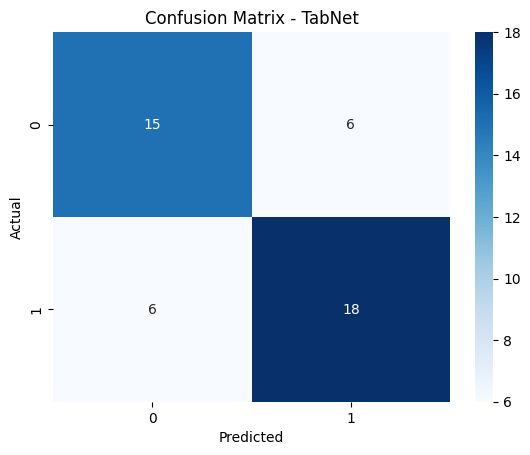

In [ ]:
y_pred = tabnet_clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

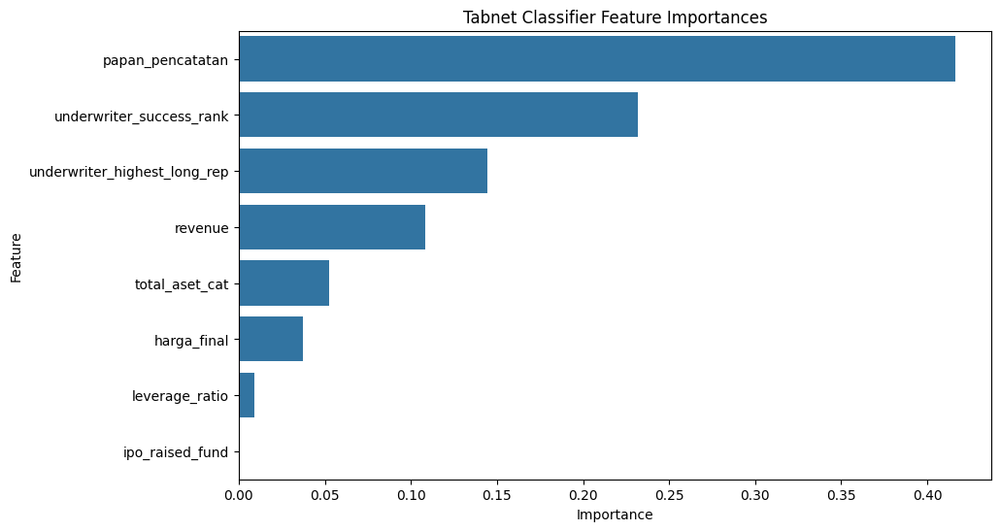

In [ ]:
importances = tabnet_clf.feature_importances_
importances = pd.Series(importances)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1y'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Tabnet Classifier Feature Importances")
plt.show()

In [ ]:
X[:, -len(numerical_cols):] = StandardScaler().fit_transform(X[:, -len(numerical_cols):])

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_preds = []
y_true = []

for train_idx, test_idx in cv.split(X_resampled, y_resampled):
    X_tr, X_te = X_resampled[train_idx], X_resampled[test_idx]
    y_tr, y_te = y_resampled[train_idx], y_resampled[test_idx]

    model = TabNetClassifier(
        seed=42,
        verbose=10,
    )

    model.fit(
        X_train=X_tr, y_train=y_tr,
        eval_set=[(X_te, y_te)],
        eval_name=["val"],
        eval_metric=["balanced_accuracy"],
        batch_size=48,
    )

    y_preds.extend(model.predict(X_te))
    y_true.extend(y_te)

print(classification_report(y_true, y_preds))

epoch 0  | loss: 0.96061 | val_balanced_accuracy: 0.6875  |  0:00:00s
epoch 10 | loss: 0.64536 | val_balanced_accuracy: 0.625   |  0:00:01s

Early stopping occurred at epoch 10 with best_epoch = 0 and best_val_balanced_accuracy = 0.6875
epoch 0  | loss: 0.83006 | val_balanced_accuracy: 0.33696 |  0:00:00s
epoch 10 | loss: 0.61805 | val_balanced_accuracy: 0.50543 |  0:00:00s

Early stopping occurred at epoch 14 with best_epoch = 4 and best_val_balanced_accuracy = 0.54801
epoch 0  | loss: 1.00079 | val_balanced_accuracy: 0.61322 |  0:00:00s
epoch 10 | loss: 0.5643  | val_balanced_accuracy: 0.5942  |  0:00:01s

Early stopping occurred at epoch 16 with best_epoch = 6 and best_val_balanced_accuracy = 0.71739
epoch 0  | loss: 0.85888 | val_balanced_accuracy: 0.53261 |  0:00:00s
epoch 10 | loss: 0.58252 | val_balanced_accuracy: 0.53714 |  0:00:01s
epoch 20 | loss: 0.56613 | val_balanced_accuracy: 0.5779  |  0:00:01s

Early stopping occurred at epoch 24 with best_epoch = 14 and best_val_balanc

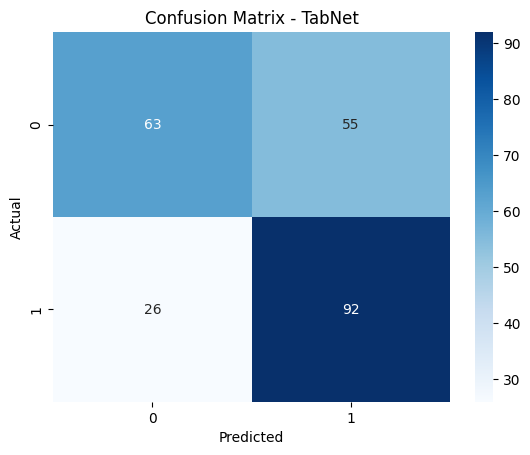

In [ ]:
cm = confusion_matrix(y_true, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

In [ ]:
import joblib

with open('tabnet_1M.pkl', 'wb') as f:
    joblib.dump(tabnet_clf, f)

#### LIME Explanation for TabPFN 1M

In [ ]:
# explain_with_lime(
#     model=clf,
#     X_train=pd.DataFrame(X_train, columns=features_to_use['1m']),
#     X_test=pd.DataFrame(X_test, columns=features_to_use['1m']),
#     feature_names=features_to_use['1m'],
#     class_names=['plus', 'minus']
# )

#### LIME Explanation for Tabnet 1M

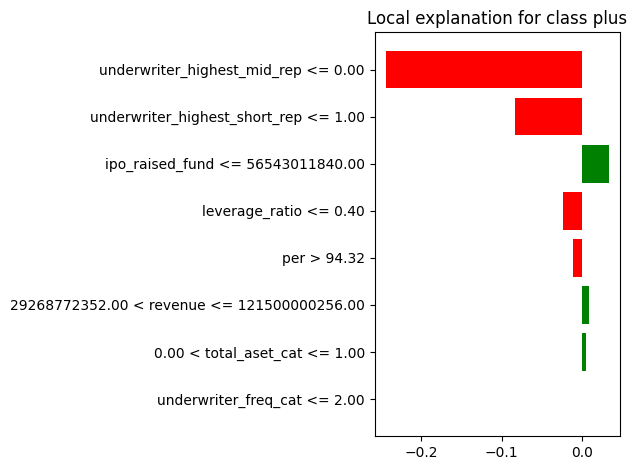

In [ ]:
explain_with_lime(
    model=tabnet_clf,
    X_train=pd.DataFrame(X_train, columns=features_to_use['1m']),
    X_test=pd.DataFrame(X_test, columns=features_to_use['1m']),
    feature_names=features_to_use['1m'],
    class_names=['minus', 'plus']
)

In [ ]:
explain_and_save_lime_pngs(
    model=tabnet_clf,
    X_train=X_train,
    X_test=X_test,
    feature_names=features_to_use['1m'],
    class_names=['minus', 'plus'],
    sample_index=0,
    filename_prefix="analisis_ipo"
)

Membuat penjelasan LIME untuk sampel ke-0...
-> Plot untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_plot.png
-> Tabel untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_tabel.png
-> Plot untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_plot.png
-> Tabel untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_tabel.png

✅ Semua file PNG berhasil dibuat.


### 6M %

In [ ]:
df_custom['6m'].value_counts()

,count
6m,
0,110
2,95
1,18


In [ ]:
X = df_custom[features_to_use['6m']].copy()
y = df_custom['6m'].copy()

X = X[y != 1]
y = y[y != 1]

y = y.replace({2: 1})

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=5)

In [ ]:
y.value_counts()

,count
6m,
0,110
1,95


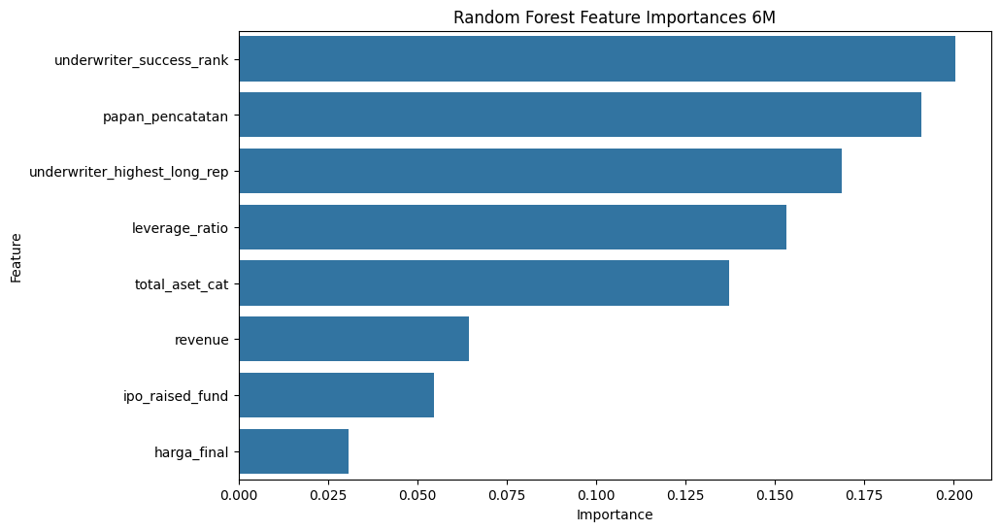

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train, y_train)

importances = rf.feature_importances_
importances = pd.Series(importances, index=X_train.columns)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['6m'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Random Forest Feature Importances 6M")
plt.show()

#### TabPFN

In [ ]:
clf = TabPFNClassifier(device="cuda" if torch.cuda.is_available() else "cpu")

clf.fit(X_train, y_train)

TabPFNClassifier(device='cpu')

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
thresholds = np.arange(0.3, 0.61, 0.01)
f1_scores = []

probs = cross_val_predict(
    clf,
    X, y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    method='predict_proba'
)[:, 1]

for t in thresholds:
    preds = (probs >= t).astype(int)
    score = f1_score(y, preds, average='macro')
    f1_scores.append(score)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Best F1 Macro Score: {best_f1:.4f}")

Best Threshold: 0.52
Best F1 Macro Score: 0.6850


Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.91      0.83        22
           1       0.87      0.68      0.76        19

    accuracy                           0.80        41
   macro avg       0.82      0.80      0.80        41
weighted avg       0.81      0.80      0.80        41



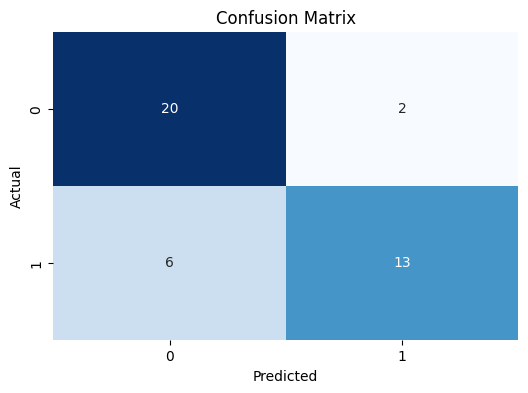

In [ ]:
probs = clf.predict_proba(X_test)[:, 1]
y_pred = (probs > best_threshold).astype(int)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

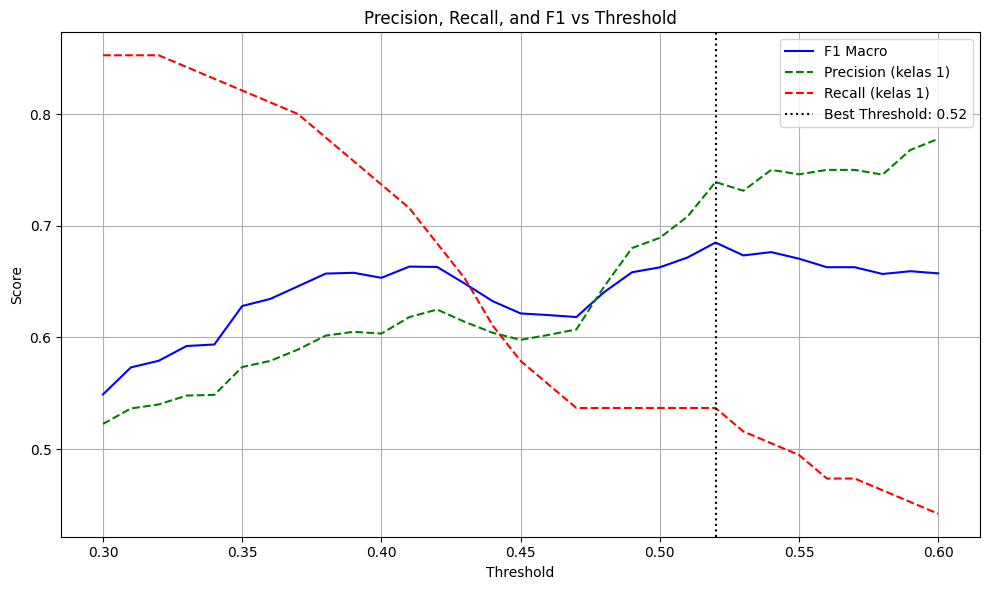

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
probs = cross_val_predict(
    clf,
    X, y,
    cv=cv,
    method='predict_proba'
)[:, 1]

f1_scores = []
precisions = []
recalls = []

for t in thresholds:
    preds = (probs >= t).astype(int)
    f1_scores.append(f1_score(y, preds, average='macro'))
    precisions.append(precision_score(y, preds))
    recalls.append(recall_score(y, preds))

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, label='F1 Macro', color='blue')
plt.plot(thresholds, precisions, label='Precision (kelas 1)', linestyle='--', color='green')
plt.plot(thresholds, recalls, label='Recall (kelas 1)', linestyle='--', color='red')
plt.axvline(best_threshold, linestyle=':', color='black', label=f'Best Threshold: {best_threshold:.2f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 vs Threshold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

F1 Score (threshold=0.5200000000000002): 0.6850
Accuracy: 0.697560975609756
Classification Report:

              precision    recall  f1-score   support

           0       0.68      0.84      0.75       110
           1       0.74      0.54      0.62        95

    accuracy                           0.70       205
   macro avg       0.71      0.69      0.68       205
weighted avg       0.71      0.70      0.69       205



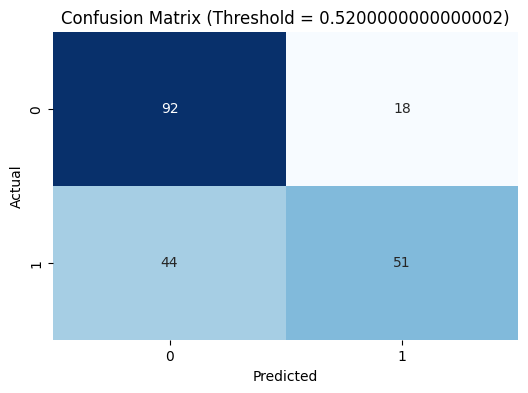

In [ ]:
threshold = best_threshold
preds = (probs >= threshold).astype(int)

cm = confusion_matrix(y, preds)
print(f"F1 Score (threshold={threshold}): {f1_score(y, preds, average='macro'):.4f}")
print(f"Accuracy: {accuracy_score(y, preds)}")
print("Classification Report:\n")
print(classification_report(y, preds))

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix (Threshold = {threshold})')
plt.show()

In [ ]:
import joblib

with open('tabPFN_6M.pkl', 'wb') as f:
    joblib.dump(clf, f)

#### Tabnet

In [ ]:
features_to_use['6m']

['underwriter_success_rank',
 'papan_pencatatan',
 'underwriter_highest_long_rep',
 'leverage_ratio',
 'total_aset_cat',
 'revenue',
 'ipo_raised_fund',
 'harga_final']

In [ ]:
categorical_cols_6m = []
numerical_cols_6m = []

for col in features_to_use['6m']:
    if is_categorical(df_custom, col):
        categorical_cols_6m.append(col)
    else:
        numerical_cols_6m.append(col)

print(f"Categorical Columns for 6m: {categorical_cols_6m}")
print(f"Numerical Columns for 6m: {numerical_cols_6m}")

Categorical Columns for 6m: ['underwriter_success_rank', 'papan_pencatatan', 'underwriter_highest_long_rep', 'total_aset_cat']
Numerical Columns for 6m: ['leverage_ratio', 'revenue', 'ipo_raised_fund', 'harga_final']


In [ ]:
df_custom['6m'].value_counts()

,count
6m,
0,110
2,95
1,18


In [ ]:
df_tabnet = df_custom[df_custom['6m'] != 1].copy()

X = df_tabnet[features_to_use['6m']].copy()
y = df_tabnet['6m'].astype(int).values

y[y == 2] = 1

encoder = OrdinalEncoder()
X[categorical_cols] = encoder.fit_transform(X[categorical_cols])
X = X.values.astype(np.float32)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
tabnet_clf = TabNetClassifier(
    seed=42,
    verbose=1
)

tabnet_clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_test, y_test)],
    eval_name=["val"],
    eval_metric=["balanced_accuracy"],
    max_epochs=200,
    patience=20,
    batch_size=32
)

epoch 0  | loss: 0.84711 | val_balanced_accuracy: 0.47129 |  0:00:00s
epoch 1  | loss: 0.76682 | val_balanced_accuracy: 0.61005 |  0:00:00s
epoch 2  | loss: 0.67437 | val_balanced_accuracy: 0.44019 |  0:00:00s
epoch 3  | loss: 0.62815 | val_balanced_accuracy: 0.50837 |  0:00:00s
epoch 4  | loss: 0.6212  | val_balanced_accuracy: 0.60287 |  0:00:00s
epoch 5  | loss: 0.54901 | val_balanced_accuracy: 0.65311 |  0:00:00s
epoch 6  | loss: 0.57761 | val_balanced_accuracy: 0.6567  |  0:00:01s
epoch 7  | loss: 0.53325 | val_balanced_accuracy: 0.66746 |  0:00:01s
epoch 8  | loss: 0.5518  | val_balanced_accuracy: 0.58852 |  0:00:01s
epoch 9  | loss: 0.57393 | val_balanced_accuracy: 0.6567  |  0:00:01s
epoch 10 | loss: 0.57783 | val_balanced_accuracy: 0.63038 |  0:00:01s
epoch 11 | loss: 0.53141 | val_balanced_accuracy: 0.66029 |  0:00:01s
epoch 12 | loss: 0.52261 | val_balanced_accuracy: 0.66029 |  0:00:01s
epoch 13 | loss: 0.5448  | val_balanced_accuracy: 0.64833 |  0:00:02s
epoch 14 | loss: 0.5

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.73      0.71        22
           1       0.67      0.63      0.65        19

    accuracy                           0.68        41
   macro avg       0.68      0.68      0.68        41
weighted avg       0.68      0.68      0.68        41



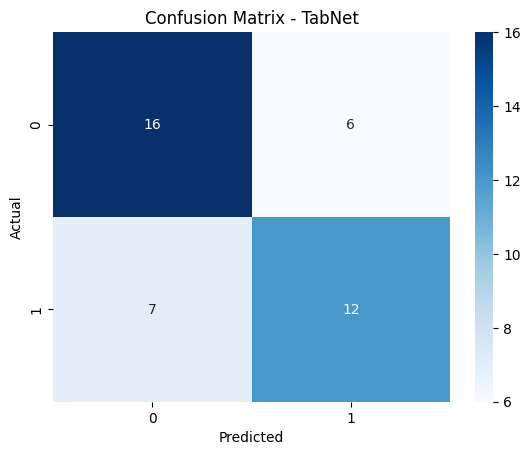

In [ ]:
y_pred = tabnet_clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

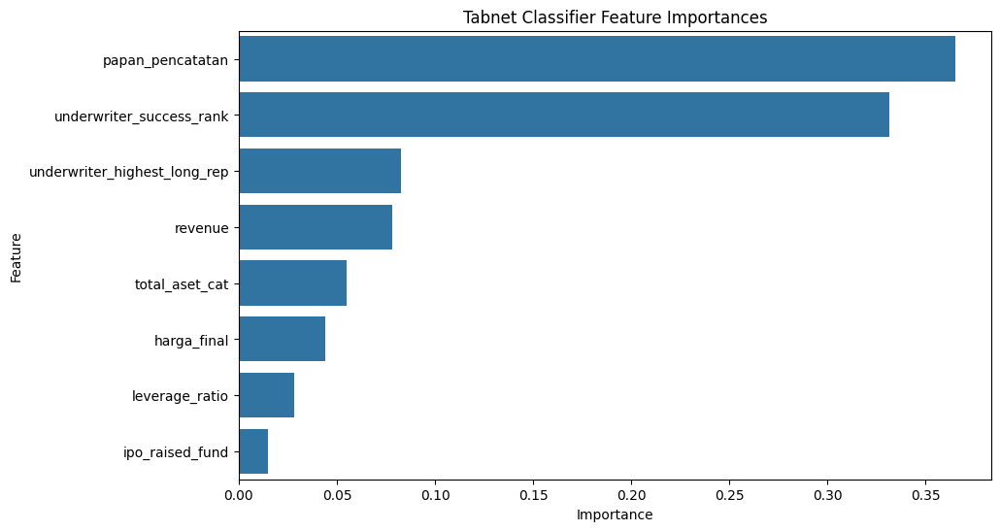

In [ ]:
importances = tabnet_clf.feature_importances_
importances = pd.Series(importances)
importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features_to_use['1y'])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Tabnet Classifier Feature Importances")
plt.show()

In [ ]:
X[:, -len(numerical_cols):] = StandardScaler().fit_transform(X[:, -len(numerical_cols):])

ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_preds = []
y_true = []

for train_idx, test_idx in cv.split(X_resampled, y_resampled):
    X_tr, X_te = X_resampled[train_idx], X_resampled[test_idx]
    y_tr, y_te = y_resampled[train_idx], y_resampled[test_idx]

    model = TabNetClassifier(
        seed=42,
        verbose=10,
    )

    model.fit(
        X_train=X_tr, y_train=y_tr,
        eval_set=[(X_te, y_te)],
        eval_name=["val"],
        eval_metric=["balanced_accuracy"],
        batch_size=48,
    )

    y_preds.extend(model.predict(X_te))
    y_true.extend(y_te)

print(classification_report(y_true, y_preds))

epoch 0  | loss: 1.05175 | val_balanced_accuracy: 0.31818 |  0:00:00s
epoch 10 | loss: 0.58437 | val_balanced_accuracy: 0.52273 |  0:00:00s

Early stopping occurred at epoch 14 with best_epoch = 4 and best_val_balanced_accuracy = 0.63636
epoch 0  | loss: 0.98992 | val_balanced_accuracy: 0.47727 |  0:00:00s
epoch 10 | loss: 0.56428 | val_balanced_accuracy: 0.65909 |  0:00:00s

Early stopping occurred at epoch 17 with best_epoch = 7 and best_val_balanced_accuracy = 0.70455
epoch 0  | loss: 1.00044 | val_balanced_accuracy: 0.56818 |  0:00:00s
epoch 10 | loss: 0.60943 | val_balanced_accuracy: 0.54545 |  0:00:00s

Early stopping occurred at epoch 13 with best_epoch = 3 and best_val_balanced_accuracy = 0.68182
epoch 0  | loss: 1.03546 | val_balanced_accuracy: 0.56818 |  0:00:00s
epoch 10 | loss: 0.61735 | val_balanced_accuracy: 0.54545 |  0:00:00s

Early stopping occurred at epoch 11 with best_epoch = 1 and best_val_balanced_accuracy = 0.59091
epoch 0  | loss: 0.94161 | val_balanced_accuracy

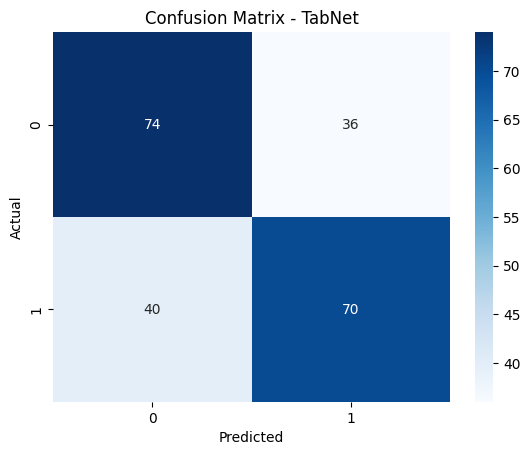

In [ ]:
cm = confusion_matrix(y_true, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - TabNet')
plt.show()

In [ ]:
import joblib

with open('./tabnet_6M.pkl', 'wb') as f:
    joblib.dump(tabnet_clf, f)

#### LIME Explanation for TabPFN 6M

In [ ]:
# explain_with_lime(
#     model=clf,
#     X_train=pd.DataFrame(X_train, columns=features_to_use['6m']),
#     X_test=pd.DataFrame(X_test, columns=features_to_use['6m']),
#     feature_names=features_to_use['6m'],
#     class_names=['plus', 'minus']
# )

#### LIME Explanation for Tabnet 6M

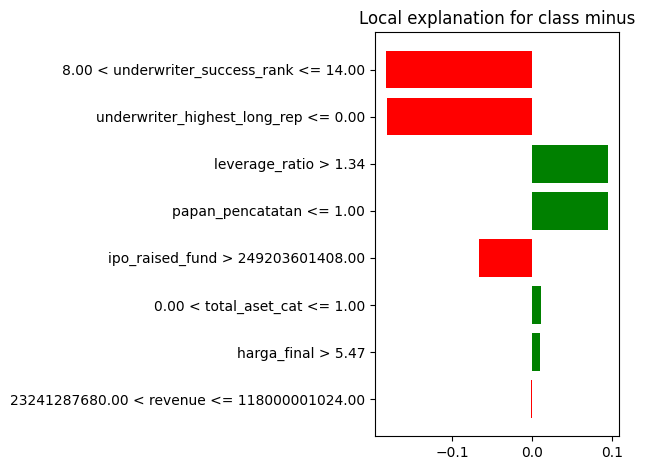

In [ ]:
explain_with_lime(
    model=tabnet_clf,
    X_train=pd.DataFrame(X_train, columns=features_to_use['6m']),
    X_test=pd.DataFrame(X_test, columns=features_to_use['6m']),
    feature_names=features_to_use['6m'],
    class_names=['plus', 'minus']
)

In [ ]:
explain_and_save_lime_pngs(
    model=tabnet_clf,
    X_train=X_train,
    X_test=X_test,
    feature_names=features_to_use['6m'],
    class_names=['plus', 'minus'],
    sample_index=0,
    filename_prefix="analisis_ipo"
)

Membuat penjelasan LIME untuk sampel ke-0...
-> Plot untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_plot.png
-> Tabel untuk kelas 'plus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_plus_tabel.png
-> Plot untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_plot.png
-> Tabel untuk kelas 'minus' berhasil disimpan ke: analisis_ipo_sampel_0_kelas_minus_tabel.png

✅ Semua file PNG berhasil dibuat.


In [ ]:
features_to_use

{'1d': ['underwriter_highest_short_rep',
  'ownership',
  'underwriter_has_bigbank',
  'underwriter_highest_mid_rep',
  'float',
  'lead_underwriter'],
 '1w': ['underwriter_highest_short_rep',
  'underwriter_highest_mid_rep',
  'total_aset_cat',
  'papan_pencatatan',
  'ipo_raised_fund',
  'revenue',
  'leverage_ratio',
  'underwriter_avg_aset_cat'],
 '1m': ['underwriter_highest_mid_rep',
  'underwriter_highest_short_rep',
  'per',
  'leverage_ratio',
  'underwriter_freq_cat',
  'total_aset_cat',
  'ipo_raised_fund',
  'revenue'],
 '6m': ['underwriter_success_rank',
  'papan_pencatatan',
  'underwriter_highest_long_rep',
  'leverage_ratio',
  'total_aset_cat',
  'revenue',
  'ipo_raised_fund',
  'harga_final'],
 '1y': ['papan_pencatatan',
  'underwriter_success_rank',
  'underwriter_highest_long_rep',
  'revenue',
  'total_aset_cat',
  'harga_final',
  'leverage_ratio',
  'ipo_raised_fund']}